<h4 style="font-size: 30px;"><strong>Packages</strong></h4>

In [1]:
from glob import glob
import pandas as pd
import os

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples, silhouette_score

from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

from sklearn.cluster import KMeans, AgglomerativeClustering
import scipy.cluster.hierarchy as sch

from scipy.spatial.distance import cdist

import numpy as np
import math

import rasterio as rio
import geopandas as gpd
from rasterio.plot import show
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.offsetbox import OffsetImage, AnnotationBbox


<h4 style="font-size: 30px;"><strong>Paths</strong></h4>

In [3]:
hourly_input = '../../DATA/rainfall/hourly_gauges_SIATA_EPM/'
daily_output = '../../DATA/rainfall/daily_gauges_SIATA_EPM/'
monthly_output = '../../DATA/rainfall/monthly_gauges_SIATA_EPM/'
annual_output = '../../DATA/rainfall/annual_gauges_SIATA_EPM/'
path_ENSO = '../../DATA/rainfall/ENSO/'
path_inventory = '../../DATA/landslides/'
output_figures = '../../FIGURES/temporal_analysis/'

In [4]:
# 📌 Definir rutas de archivos
main = '/home/oisanchezp/Geotecnia/MAESTRIA/Maestria_Daissy/DEM-20240409T233930Z-001/DEM/'
ruta_amva = '/home/oisanchezp/Geotecnia/shape_files/'
ruta_coor = '/home/oisanchezp/Geotecnia/shape_files/Est_All/'


# 📌 Cargar datos espaciales
hill_src = rio.open(main + "DEM_west_Hillshade_Clip_r.tif")
hill = hill_src.read(1)
hill = np.where(hill == hill[0, 0], np.nan, hill)

AMVA = gpd.read_file(f"{ruta_amva}mpios_amva_qnk.shp")
pluvios_shp = gpd.read_file(ruta_coor + "Est_All.shp")

## **Hourly**

In [4]:

hourly_files = sorted(glob(hourly_input + 'H_Datos_Procesados_Est_*.csv'))

stations_with_paths = [
    (int(os.path.basename(file).split('_')[-1].split('.')[0]), file) 
    for file in hourly_files]

stations_with_paths_sorted = sorted(stations_with_paths, key=lambda x: x[0])

# Filtra las estaciones de SIATA excluyendo las estaciones de EPM (últimas 16)
siata_stations_with_paths = stations_with_paths_sorted[:-16]


siata_hourly_files = [station[1] for station in siata_stations_with_paths]

#Cargar y Renombrar Datos de las Estaciones
data_frames = []
station_numbers = []

for station_number, file in siata_stations_with_paths:
    station_data = pd.read_csv(file, index_col='Fecha', parse_dates=True)
    
    # Verifica y elimina la columna 'Unnamed: 0' si existe
    if 'Unnamed: 0' in station_data.columns:
        station_data = station_data.drop(columns=['Unnamed: 0'])
    
    if 'P' in station_data.columns:
        station_data.rename(columns={'P': f'Est_{station_number}'}, inplace=True)
    else:
        precip_column = [col for col in station_data.columns if 'P' in col.upper()]
        if precip_column:
            station_data.rename(columns={precip_column[0]: f'Est_{station_number}'}, inplace=True)
        else:
            print(f"Advertencia: No se encontró columna de precipitación en {file}")
            continue
    
    data_frames.append(station_data)
    station_numbers.append(station_number)

all_stations_df = pd.concat(data_frames, axis=1, join='outer')

#### Porcentaje de datos faltantes

In [5]:
# Dejar estaciones con 10 o más años de datos
min_hours = 10 * 365 * 24  # ~87,600

# Filtra columnas (estaciones) que tengan al menos 'min_hours' datos válidos (no nulos)
all_stations_df_10y = all_stations_df.loc[:, all_stations_df.count() >= min_hours]

# Filtrar filas desde '2013-01-01' hasta el final de las series
all_stations_df_10y = all_stations_df_10y.loc['2013-01-01':]

# Mostrar la cantidad de datos faltantes por estación
missing_values = all_stations_df_10y.isna().sum()
total_days = len(all_stations_df_10y)
missing_percentage = (missing_values / total_days) * 100


print("Porcentaje de datos faltantes (NaN) por estación:")
# 1. Creamos el DataFrame con ambas series
df_missing = pd.DataFrame({
    'Datos_faltantes': missing_values,
    'Porcentaje_NaN': missing_percentage
})

# 2. Redondear el porcentaje a 2 decimales
df_missing['Porcentaje_NaN'] = df_missing['Porcentaje_NaN'].round(2)

# 3. Mostrar el resultado
print(df_missing)

Porcentaje de datos faltantes (NaN) por estación:
         Datos_faltantes  Porcentaje_NaN
Est_1               4956            4.88
Est_2               3800            3.74
Est_3               9721            9.57
Est_4              11699           11.52
Est_5               4165            4.10
...                  ...             ...
Est_74              8708            8.58
Est_76             10010            9.86
Est_81              7135            7.03
Est_89             11917           11.74
Est_211             7321            7.21

[69 rows x 2 columns]


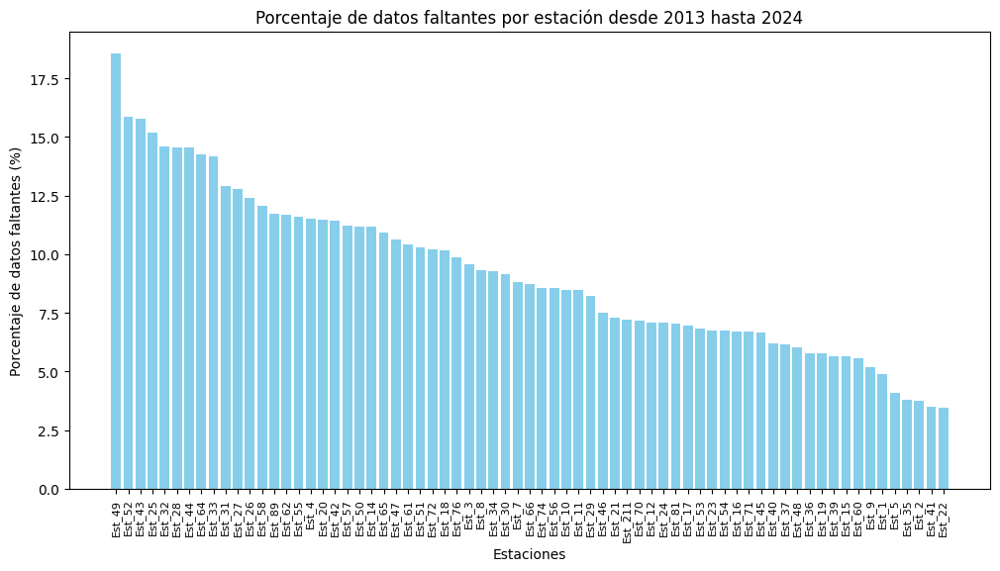

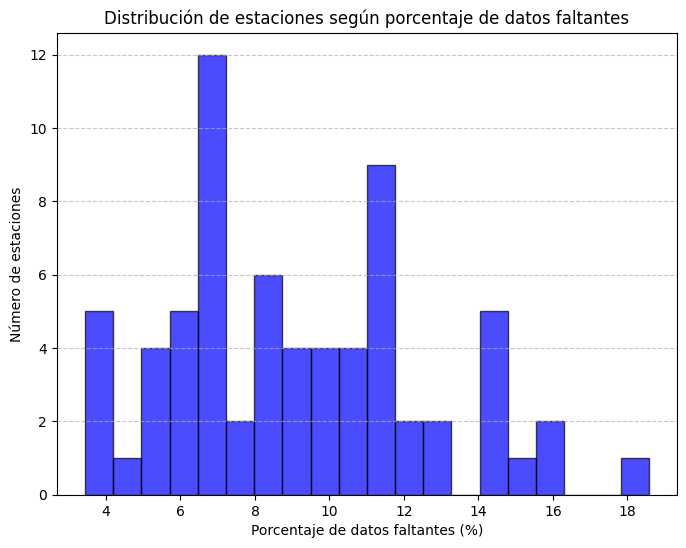

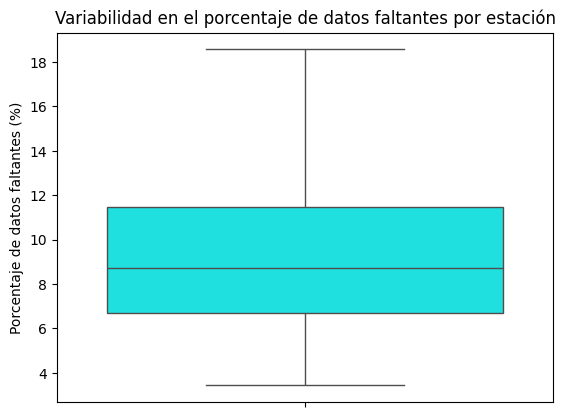

In [16]:
# Hacer un gráfico de barras con los datos faltantes
df_missing_sorted = df_missing.sort_values(by='Porcentaje_NaN', ascending=False)

plt.figure(figsize=(12, 6))
plt.bar(df_missing_sorted.index, df_missing_sorted['Porcentaje_NaN'], color='skyblue')
plt.xticks(rotation=90, fontsize=8)
plt.ylabel("Porcentaje de datos faltantes (%)")
plt.xlabel("Estaciones")
plt.title("Porcentaje de datos faltantes por estación desde 2013 hasta 2024")
plt.show()


# Hacer un histograma de los porcentajes de datos faltantes

plt.figure(figsize=(8, 6))
plt.hist(df_missing['Porcentaje_NaN'], bins=20, color='blue', edgecolor='black', alpha=0.7)
plt.xlabel("Porcentaje de datos faltantes (%)")
plt.ylabel("Número de estaciones")
plt.title("Distribución de estaciones según porcentaje de datos faltantes")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# Hacer un boxplot de los porcentajes de datos faltantes
sns.boxplot(y=df_missing['Porcentaje_NaN'], color="cyan")
plt.ylabel("Porcentaje de datos faltantes (%)")
plt.title("Variabilidad en el porcentaje de datos faltantes por estación")
plt.show()

In [6]:
def imputar_nan_horario_por_hora(df, limit=24):
    """
    Rellena los valores NaN en un DataFrame de series temporales horarias.
    
    1. Interpola valores ausentes de hasta 'limit' horas consecutivas.
    2. Rellena los NaN restantes con la media de esa hora del día (0 a 23).

    Args:
        df (pd.DataFrame): 
            DataFrame con índice de tipo fecha (frecuencia horaria) y 
            columnas correspondientes a distintas series (por ejemplo, estaciones).
        limit (int):
            Límite de horas consecutivas a interpolar. Por defecto 24.
    
    Returns:
        pd.DataFrame: DataFrame con los NaN imputados.
    """
    df_imputado = df.copy()
    
    # Paso 1: Interpolar huecos de hasta 'limit' horas consecutivas
    df_imputado = df_imputado.interpolate(method='time', limit=limit, limit_direction='both')
    
    # Paso 2: Rellenar los NaN restantes con la media por hora del día
    df_imputado['Hora'] = df_imputado.index.hour

    # Calculamos la media para cada hora (0-23)
    medias_por_hora = df_imputado.groupby('Hora').transform('mean')
    
    # Rellenamos los NaN con esos valores medios
    df_imputado = df_imputado.fillna(medias_por_hora)
    
    # Eliminamos la columna auxiliar
    df_imputado.drop(columns=['Hora'], inplace=True)
    
    return df_imputado

In [7]:
all_stations_df_10y_imputed = imputar_nan_horario_por_hora(all_stations_df_10y)

missing_values_2 = all_stations_df_10y_imputed.isna().sum()
total_days = len(all_stations_df_10y_imputed)
missing_percentage = (missing_values_2 / total_days) * 100


print("Porcentaje de datos faltantes (NaN) por estación:")
# 1. Creamos el DataFrame con ambas series
df_missing = pd.DataFrame({
    'Datos_faltantes': missing_values_2,
    'Porcentaje_NaN': missing_percentage
})

# 2. Redondear el porcentaje a 2 decimales
df_missing['Porcentaje_NaN'] = df_missing['Porcentaje_NaN'].round(2)

# 3. Mostrar el resultado
print(df_missing)

Porcentaje de datos faltantes (NaN) por estación:
         Datos_faltantes  Porcentaje_NaN
Est_1                  0             0.0
Est_2                  0             0.0
Est_3                  0             0.0
Est_4                  0             0.0
Est_5                  0             0.0
...                  ...             ...
Est_74                 0             0.0
Est_76                 0             0.0
Est_81                 0             0.0
Est_89                 0             0.0
Est_211                0             0.0

[69 rows x 2 columns]


### **Hierarchical clustering**

Text(0, 0.5, 'Distancia')

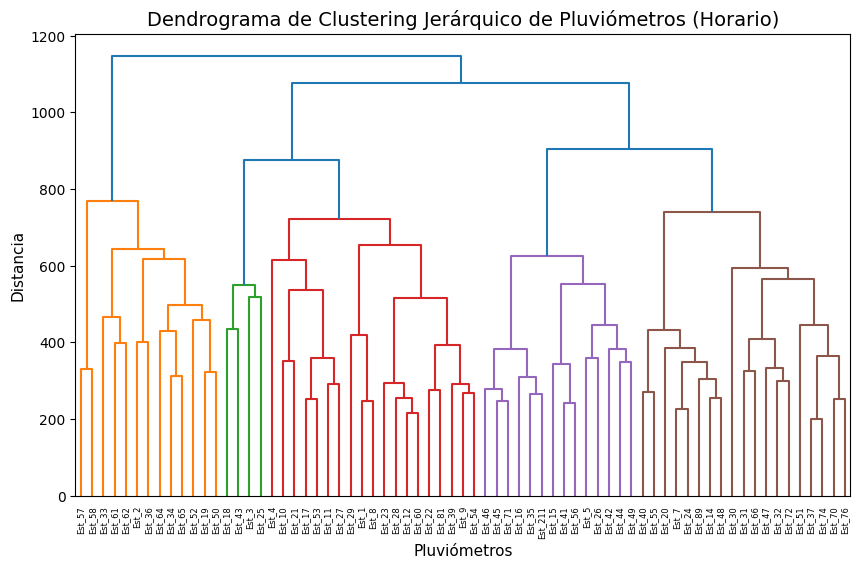

In [19]:
Z = sch.linkage(all_stations_df_10y_imputed.T, method='ward', metric='euclidean')

plt.figure(figsize=(10, 6))

dendrogram = sch.dendrogram(
    Z,
    labels=all_stations_df_10y_imputed.columns,
    leaf_rotation=90, 
    leaf_font_size=6
)

plt.title("Dendrograma de Clustering Jerárquico de Pluviómetros (Horario)", fontsize=14)
plt.xlabel("Pluviómetros", fontsize=11)
plt.ylabel("Distancia", fontsize=11)

### Número óptimo de clusters: 
### Método del codo y Silhouette Score

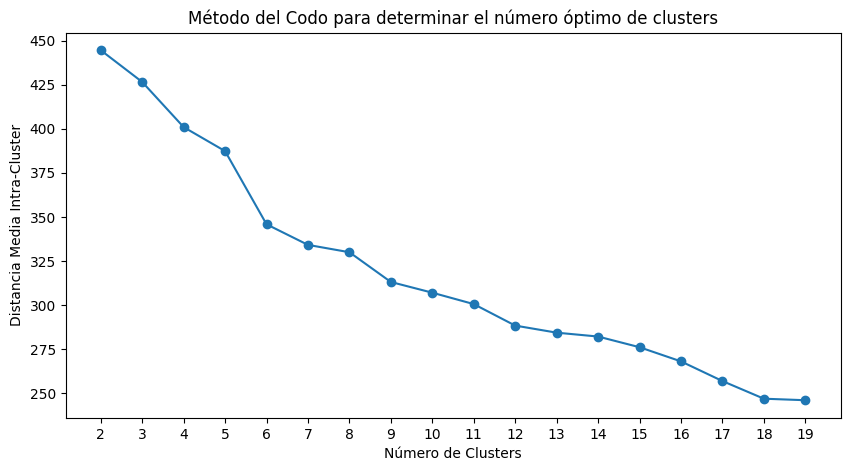

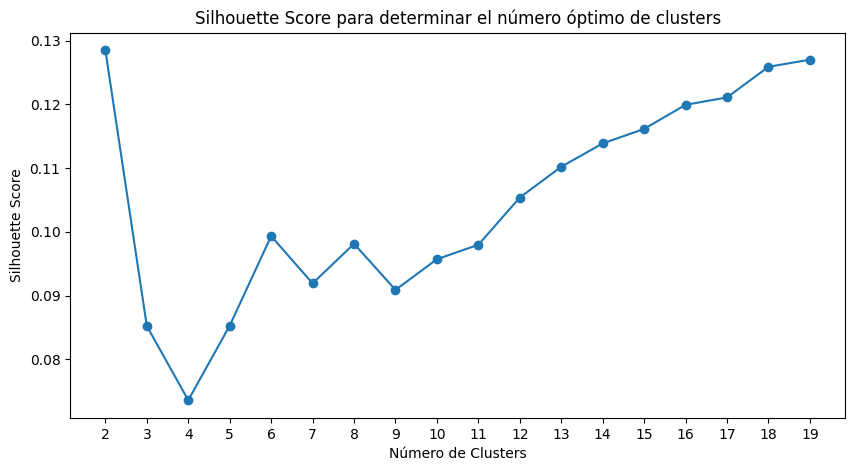

In [20]:
mean_distances = []
silhouette_scores = []
range_n_clusters = range(2, 20)

for n_clusters in range_n_clusters:
    clustering = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
    labels = clustering.fit_predict(all_stations_df_10y_imputed.T)
    cluster_distances = []
    for i in range(n_clusters):
        cluster_points = all_stations_df_10y_imputed.T[labels == i]
        if len(cluster_points) > 1:
            distances = cdist(cluster_points, cluster_points, 'euclidean')
            cluster_distances.append(np.mean(distances))
    mean_distances.append(np.mean(cluster_distances))
    silhouette_avg = silhouette_score(all_stations_df_10y_imputed.T, labels)
    silhouette_scores.append(silhouette_avg)

plt.figure(figsize=(10, 5))
plt.plot(range_n_clusters, mean_distances, marker='o')
plt.title('Método del Codo para determinar el número óptimo de clusters')
plt.xticks(range_n_clusters)
plt.xlabel('Número de Clusters')
plt.ylabel('Distancia Media Intra-Cluster')
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.title('Silhouette Score para determinar el número óptimo de clusters')
plt.xticks(range_n_clusters)
plt.xlabel('Número de Clusters')
plt.ylabel('Silhouette Score')
plt.show()


**Metodo del codo**: La curva tiene un punto de inflexión significativo en k=5.Después de k=5, las mejoras son marginales, lo que indica que agregar más clústeres no aporta mucho.

**Silhouette score**: El Silhouette Score mide qué tan bien separados están los clústeres. El Silhouette Score es bajo para todos los valores, lo que indica que los clústeres no están bien definidos. Aun así, el puntaje comienza a mejorar gradualmente a partir de k=5, alcanzando un valor decente en k=7 y k=8.

### Gap Statistic y Davies-Bouldin Index

In [21]:
from sklearn.cluster import KMeans
import numpy as np


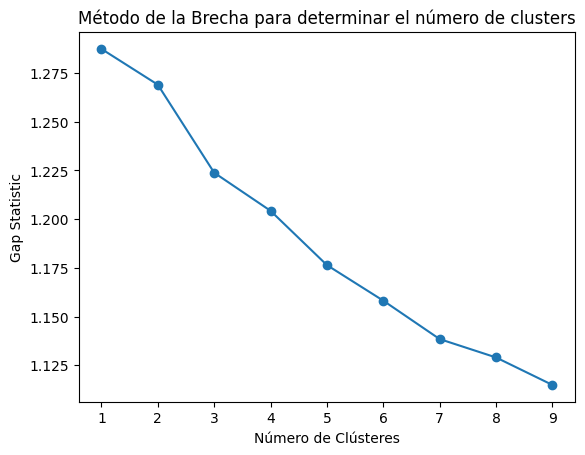

In [22]:
def gap_statistic(X, n_refs=10, max_clusters=15):
    import numpy as np
    from sklearn.cluster import KMeans
    
    gaps = np.zeros(max_clusters-1)
    results = np.zeros((max_clusters-1, n_refs))
    
    for k in range(1, max_clusters):
        km = KMeans(n_clusters=k)
        km.fit(X)
        disp = np.mean(np.min(cdist(X, km.cluster_centers_, 'euclidean'), axis=1))
        
        for i in range(n_refs):
            random_ref = np.random.random_sample(size=X.shape)
            km.fit(random_ref)
            ref_disp = np.mean(np.min(cdist(random_ref, km.cluster_centers_, 'euclidean'), axis=1))
            results[k-1, i] = np.log(ref_disp)
        
        gaps[k-1] = np.log(disp) - np.mean(results[k-1, :])
    
    return gaps

gaps = gap_statistic(all_stations_df_10y_imputed.T.values, max_clusters=10)
plt.plot(range(1, 10), gaps, marker='o')
plt.xlabel('Número de Clústeres')
plt.ylabel('Gap Statistic')
plt.title('Método de la Brecha para determinar el número de clusters')
plt.show()

**Gap Statistic**: Se busca el punto donde la ganancia se estabiliza. La curva muestra una desaceleración significativa a partir de k=5. Esto indica que 5 clústeres explican la mayor parte de la variabilidad, y más clústeres solo agregan complejidad.

In [23]:
from sklearn.metrics import davies_bouldin_score

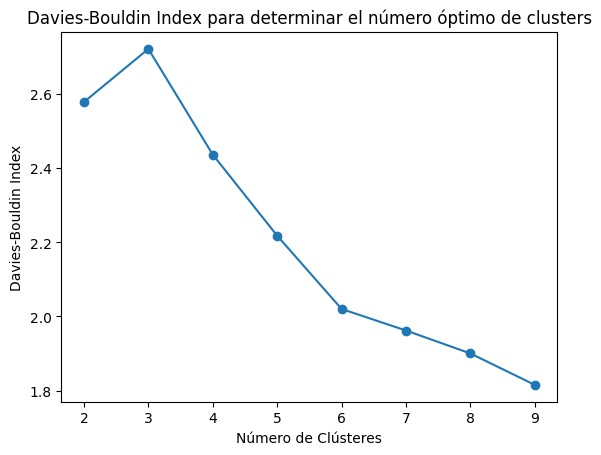

In [24]:
davies_bouldin = []
for k in range(2, 10):
    clustering = AgglomerativeClustering(n_clusters=k)
    labels = clustering.fit_predict(all_stations_df_10y_imputed.T)
    score = davies_bouldin_score(all_stations_df_10y_imputed.T, labels)
    davies_bouldin.append(score)

plt.plot(range(2, 10), davies_bouldin, marker='o')
plt.xlabel('Número de Clústeres')
plt.ylabel('Davies-Bouldin Index')
plt.title('Davies-Bouldin Index para determinar el número óptimo de clusters')
plt.show()

**Davies-Bouldin Index**: Valores más bajos son mejores (clústeres más compactos y separados). El índice disminuye consistentemente a medida que aumenta k. Sin embargo: Hay un descenso significativo en k=5, y la mejora se reduce después. Esto sugiere que más clústeres no aportan una mejora sustancial en la calidad.


### Validación cruzada con estabilidad de los clústeres

In [25]:
from sklearn.utils import resample

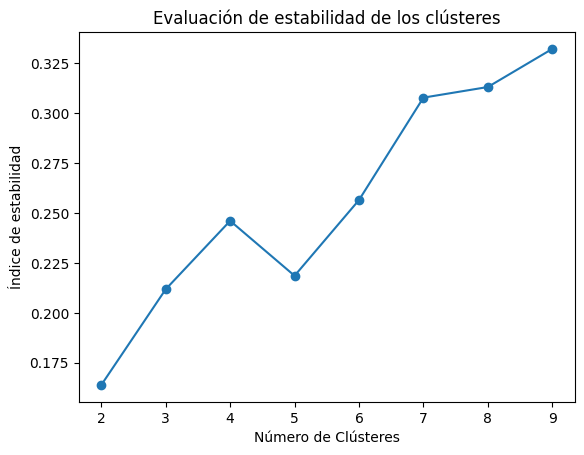

In [26]:

def stability_index(X, max_clusters=10, n_bootstrap=10):
    stability_scores = []
    
    for k in range(2, max_clusters):
        labels_sets = []
        scores = []
        
        for _ in range(n_bootstrap):
            # Realiza el remuestreo con el 90% de los datos
            X_sample = resample(X, replace=True, n_samples=int(0.9 * X.shape[0]), random_state=42)
            
            # Aplica clustering
            clustering = AgglomerativeClustering(n_clusters=k)
            labels = clustering.fit_predict(X_sample)
            
            # Guarda las etiquetas para análisis
            labels_sets.append((X_sample, labels))
        
        # Calcula silhouette_score solo sobre el subconjunto de datos correspondiente
        for X_sub, labels in labels_sets:
            if len(np.unique(labels)) > 1:  # silhouette_score requiere al menos 2 clústeres
                score = silhouette_score(X_sub, labels)
                scores.append(score)
        
        # Guarda el promedio de silhouette_score
        stability_scores.append(np.mean(scores) if scores else np.nan)  

    return stability_scores

stability_scores = stability_index(all_stations_df_10y_imputed.T.values)
plt.plot(range(2, 10), stability_scores, marker='o')
plt.xlabel('Número de Clústeres')
plt.ylabel('Índice de estabilidad')
plt.title('Evaluación de estabilidad de los clústeres')
plt.show()




**Evaluación de Estabilidad de los Clústeres**: La estabilidad de los clústeres aumenta con más clústeres. La estabilidad mejora consistentemente hasta k=6 o k=7, pero hay un salto inicial en k=5. Esto respalda que k=5 ofrece un buen balance entre estabilidad y simplicidad. 5 o 6 clústeres son adecuados.




### Mapa de cluster

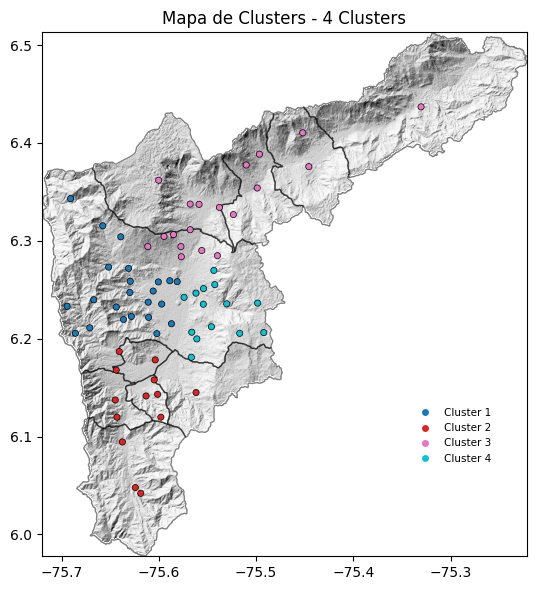

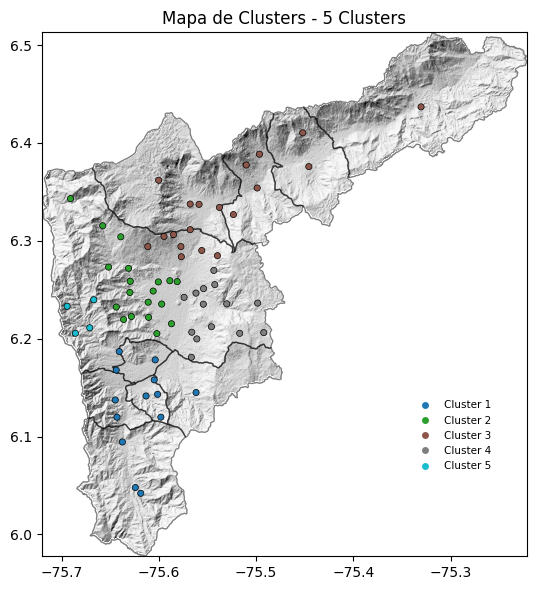

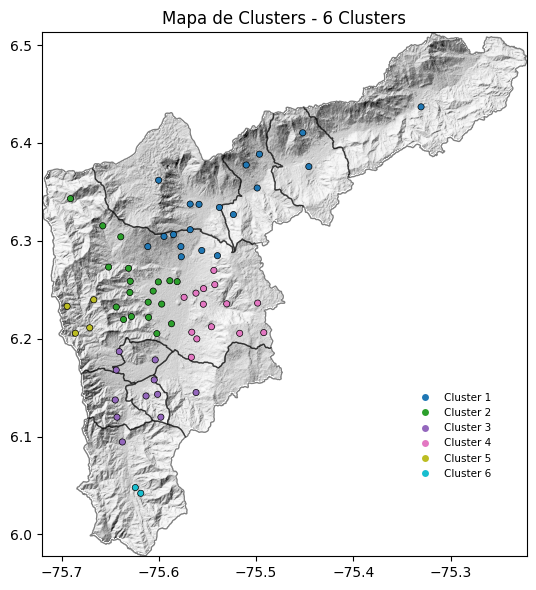

In [17]:


# 📌 Asegurar que los identificadores de estaciones coincidan con los datos
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']
all_stations_df_10y_imputed.columns = (
    all_stations_df_10y_imputed.columns
    .str.replace("Est_", "")
    .astype(int)
)

# 📌 Función para graficar el mapa de clusters
def plot_cluster_map(n_clusters):
    """
    Genera y grafica un mapa con la clasificación de estaciones en clusters.

    Parámetros:
    - n_clusters (int): Número de clusters a calcular.
    """
    # 📌 Aplicar Agglomerative Clustering
    hc = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
    labels_hc = hc.fit_predict(all_stations_df_10y_imputed.T)

    # 📌 Asignar colores a los clusters
    colores_base = plt.rcParams['axes.prop_cycle'].by_key()['color']
    colores = colores_base * (n_clusters // len(colores_base)) + colores_base[:n_clusters % len(colores_base)]

    # 📌 Crear nueva columna con los clusters en el GeoDataFrame
    for i in np.unique(labels_hc):
        cluster = all_stations_df_10y_imputed.columns[labels_hc == i]
        pluvios_shp_c.loc[cluster, 'color'] = colores[i]
        pluvios_shp_c.loc[cluster, 'cluster_name'] = f'Cluster {i+1}'

    # 📌 Generar el mapa
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)
    pluvios_shp_c.plot(ax=ax, c=pluvios_shp_c['color'], edgecolor='k', markersize=20, linewidth=0.5,
                       column="cluster_name",
                       categorical=True,
                       legend=True,
                       legend_kwds={"loc": "center left", "bbox_to_anchor": (0.75, 0.23), "fontsize": 7.5,
                                    "markerscale": 0.5, "frameon": False})
    plt.title(f"Mapa de Clusters - {n_clusters} Clusters", fontsize=12)
    plt.tight_layout()
    plt.show()


# 📌 Generar mapas para 4, 5 y 6 clusters
for n in [4, 5, 6]:
    plot_cluster_map(n)

## **CON MATRIZ DE VECINDAD**

In [8]:
import scipy.sparse as sp
from scipy.spatial import Delaunay
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph, radius_neighbors_graph
from rasterio.plot import show
from pyproj import Transformer

In [ ]:
# Cargar coordenadas
coords_df = pd.read_csv("../../DATA/coords_SIATA.csv", index_col="Codigo")
# 📌 Convertir coordenadas geográficas a UTM
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3116", always_xy=True)
coords_df['X'], coords_df['Y'] = zip(*coords_df.apply(lambda row: transformer.transform(row['Longitude'], row['Latitude']), axis=1))


# 📌 Asegurar que los identificadores de estaciones coincidan con los datos
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']
all_stations_df_10y_imputed.columns = (
    all_stations_df_10y_imputed.columns
    .str.replace("Est_", "")
    .astype(int)
)

# Validar que los índices coincidan entre las coordenadas y las series de tiempo
all_stations_df_10y_imputed.columns = all_stations_df_10y_imputed.columns.astype(int)
coords_df = coords_df.loc[all_stations_df_10y_imputed.columns]

# 📌 Filtrar el GeoDataFrame para que solo contenga las estaciones analizadas
pluvios_shp_c = pluvios_shp_c.loc[all_stations_df_10y_imputed.columns]


In [17]:
# 📌 Función para construir la matriz de conectividad
def build_connectivity_matrix(method, param):
    """
    Construye la matriz de conectividad para el clustering.

    Parámetros:
    - method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Número de vecinos para k-NN o radio en metros.

    Retorna:
    - Matriz de conectividad.
    """
    if method == 'kneighbors':
        return kneighbors_graph(coords_df[['X', 'Y']], n_neighbors=int(param), include_self=False)
    elif method == 'radius':
        return radius_neighbors_graph(coords_df[['X', 'Y']], radius=float(param), include_self=False)
    elif method == 'delaunay':
        tri = Delaunay(coords_df[['X', 'Y']].values)
        n_points = len(coords_df)
        connectivity_matrix = sp.lil_matrix((n_points, n_points))
        for simplex in tri.simplices:
            for i in range(3):
                for j in range(i + 1, 3):
                    connectivity_matrix[simplex[i], simplex[j]] = 1
                    connectivity_matrix[simplex[j], simplex[i]] = 1
        return connectivity_matrix.tocsr()
    else:
        raise ValueError("Método no reconocido. Usa 'kneighbors', 'radius' o 'delaunay'.")

# 📌 Función para graficar el mapa de clusters
def plot_cluster_map(n_clusters, connectivity_method='kneighbors', param=5):
    """
    Genera y grafica un mapa con la clasificación de estaciones en clusters.

    Parámetros:
    - n_clusters (int): Número de clusters a calcular.
    - connectivity_method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Parámetro de conectividad (número de vecinos o radio en metros).
    """
    # 📌 Construir matriz de conectividad
    connectivity = build_connectivity_matrix(connectivity_method, param)

    # 📌 Aplicar Agglomerative Clustering
    hc = AgglomerativeClustering(n_clusters=n_clusters, connectivity=connectivity, linkage='ward')
    labels_hc = hc.fit_predict(all_stations_df_10y_imputed.T)

    # 📌 Asignar clusters al GeoDataFrame
    pluvios_shp_c['cluster'] = labels_hc

    # 📌 Asignar colores a los clusters
    colores_base = plt.rcParams['axes.prop_cycle'].by_key()['color']
    colores = colores_base * (n_clusters // len(colores_base)) + colores_base[:n_clusters % len(colores_base)]
    for i in np.unique(labels_hc):
        pluvios_shp_c.loc[pluvios_shp_c['cluster'] == i, 'color'] = colores[i]

    # 📌 Generar el mapa
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)
    pluvios_shp_c.plot(ax=ax, c=pluvios_shp_c['color'], edgecolor='k', markersize=20, linewidth=0.5,
                       column="cluster",
                       categorical=True,
                       legend=True,
                       legend_kwds={"loc": "center left", "bbox_to_anchor": (0.75, 0.23), "fontsize": 7.5,
                                    "markerscale": 0.5, "frameon": False})
    
    plt.title(f"Mapa de Clusters ({connectivity_method} - {param})", fontsize=12)
    plt.tight_layout()
    plt.show()

Haciendo mapas con método de conectividad: kneighbors y parámetro 5
Generando mapa con 4 clusters


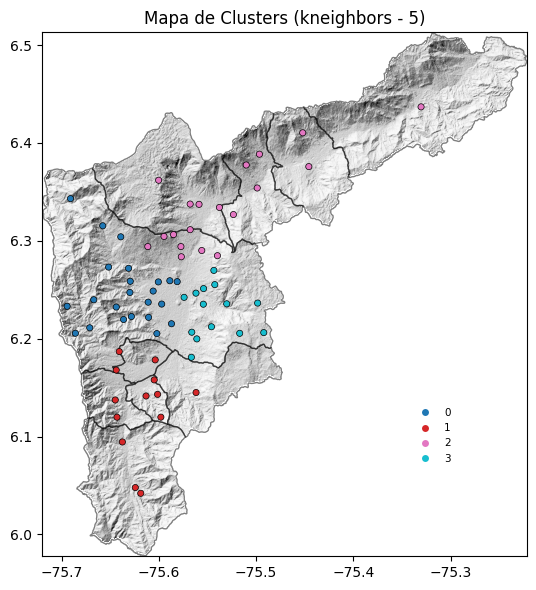

Generando mapa con 5 clusters


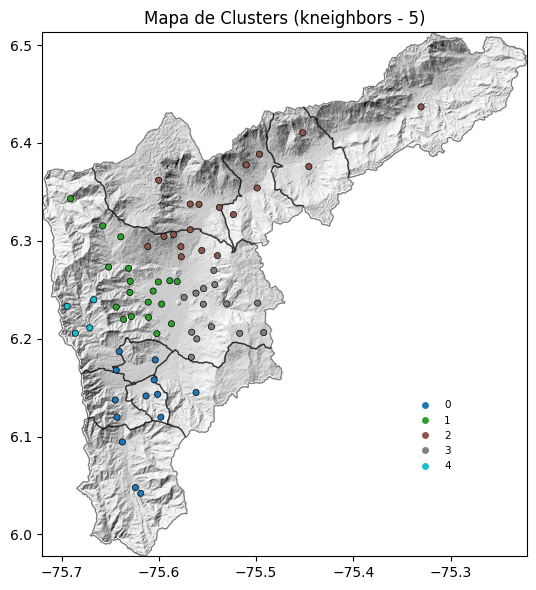

Generando mapa con 6 clusters


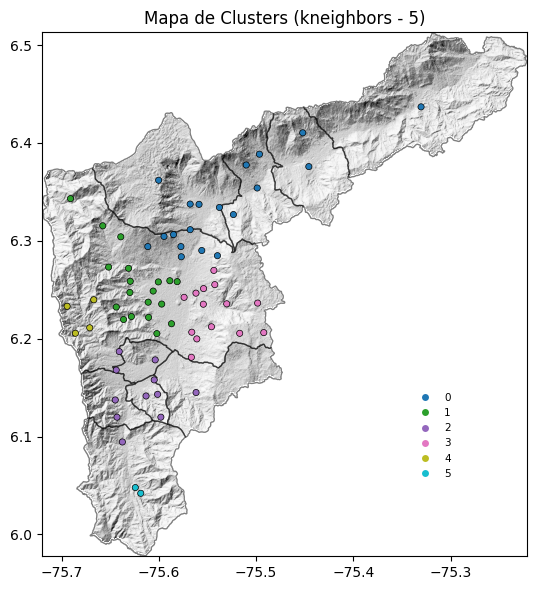

Haciendo mapas con método de conectividad: radius y parámetro 5000
Generando mapa con 4 clusters


/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:325: UserWarning: the number of connected components of the connectivity matrix is 4 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


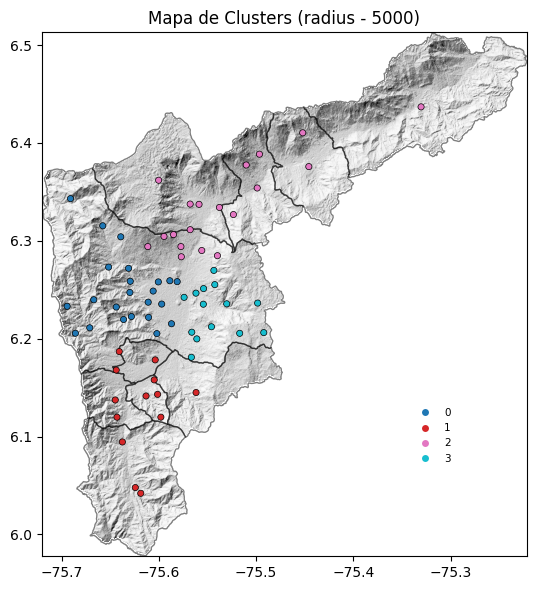

Generando mapa con 5 clusters


/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:325: UserWarning: the number of connected components of the connectivity matrix is 4 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


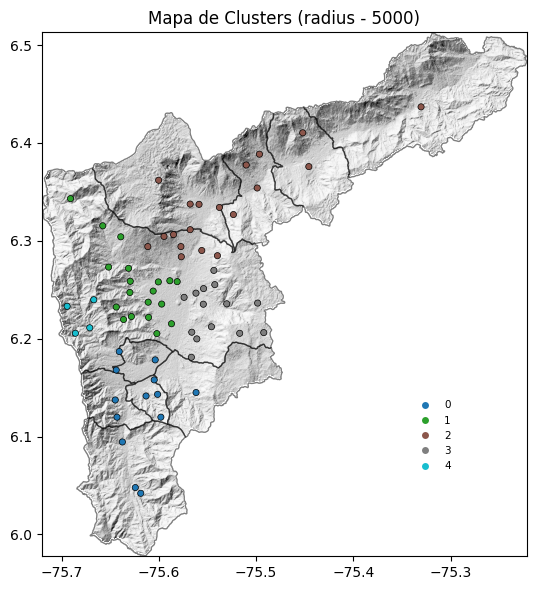

Generando mapa con 6 clusters


/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:325: UserWarning: the number of connected components of the connectivity matrix is 4 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


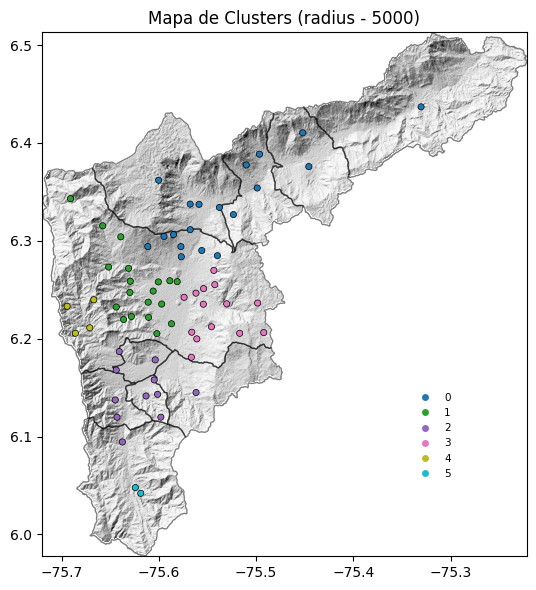

Haciendo mapas con método de conectividad: delaunay y parámetro None
Generando mapa con 4 clusters


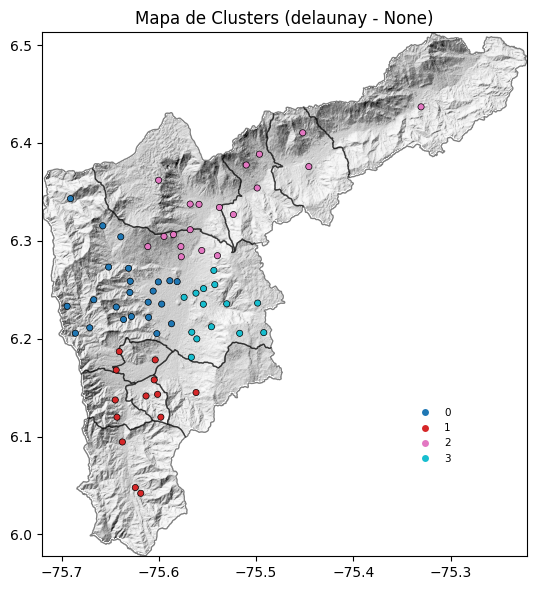

Generando mapa con 5 clusters


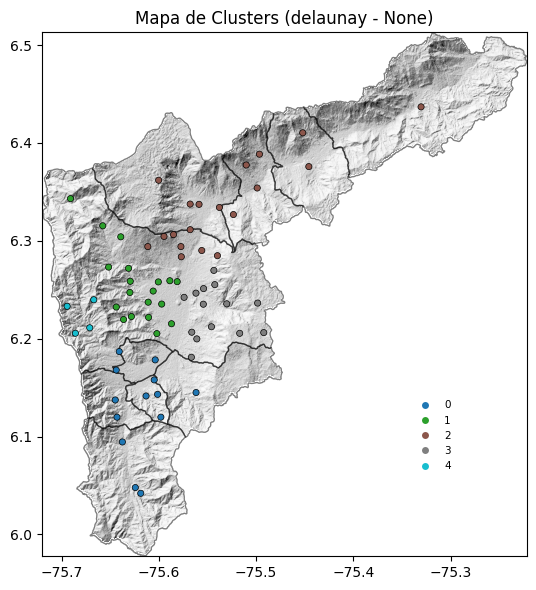

Generando mapa con 6 clusters


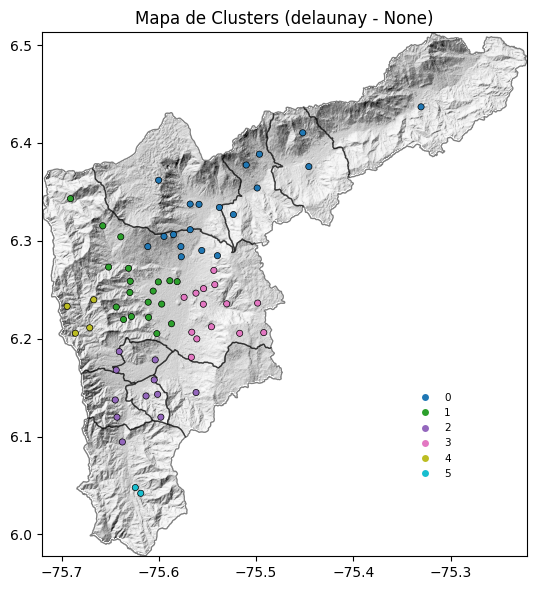

In [ ]:
# 📌 Generar mapas para 4, 5 y 6 clusters con distintas matrices de conectividad
for method, param in [('kneighbors', 5), ('radius', 5000), ('delaunay', None)]:
    print(f'Haciendo mapas con método de conectividad: {method} y parámetro {param}')
    for n in [4, 5, 6]:
        print(f"Generando mapa con {n} clusters")
        plot_cluster_map(n_clusters=n, connectivity_method=method, param=param)

| Método                                    | Ventajas                                                       | Desventajas                                         | Cuándo Usarlo                                                                    |
|-------------------------------------------|----------------------------------------------------------------|-----------------------------------------------------|----------------------------------------------------------------------------------|
| K-Means con PCA + Coordenadas             | Rápido, escalable, fácil de interpretar                        | Puede no capturar bien la variabilidad de las series| Si quieres rapidez y facilidad                                                  |
| Time-Series K-Means + Distancia Geográfica| Usa DTW, mejor para series de tiempo                           | Más lento                                           | Si te interesa que las estaciones con patrones de lluvia similares queden juntas |
| HDBSCAN con Peso Espacio-Tiempo           | Encuentra automáticamente el número de clústeres               | Puede dejar estaciones sin asignar                  | Si quieres clusters más naturales sin definir k                                  |


## K-Means con Distancia Combinada (Tiempo + Espacio)

In [15]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from tslearn.metrics import dtw


### Proyectamos coordenadas

In [16]:
# 📌 Asegurar que los identificadores de estaciones coincidan con los datos
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']
all_stations_df_10y_imputed.columns = (
    all_stations_df_10y_imputed.columns
    .str.replace("Est_", "")
    .astype(int)
)

AttributeError: Can only use .str accessor with string values!

In [ ]:
# Cargar coordenadas
coords_df = pd.read_csv("../../DATA/coords_SIATA.csv", index_col="Codigo")

# Validar que los índices coincidan entre las coordenadas y las series de tiempo
all_stations_df_10y_imputed.columns = all_stations_df_10y_imputed.columns.astype(int)
coords_df = coords_df.loc[all_stations_df_10y_imputed.columns]

# Reducir la dimensionalidad de las series de tiempo con PCA
pca = PCA(n_components=10)  # Reduce las series de tiempo a 5 componentes principales
series_pca = pca.fit_transform(all_stations_df_10y_imputed.T)

# Normalizar las coordenadas
coords_normalized = (coords_df[['Latitude', 'Longitude']] - coords_df[['Latitude', 'Longitude']].mean()) / coords_df[['Latitude', 'Longitude']].std()

# Combinar las características (PCA de las series + Coordenadas)
features_combined = np.hstack((series_pca, coords_normalized.values))

# Aplicar K-Means para 5 clústeres
kmeans = KMeans(n_clusters=5, random_state=42)
labels = kmeans.fit_predict(features_combined)

# Agregar los resultados a las coordenadas
coords_df['Cluster'] = labels

In [ ]:
# Cargar el modelo de elevación (Hillshade)
main = '/home/oisanchezp/Geotecnia/MAESTRIA/Maestria_Daissy/DEM-20240409T233930Z-001/DEM/'
hill_src = rio.open(main + "DEM_west_Hillshade_Clip_r.tif")
hill = hill_src.read(1)
hill = np.where(hill == hill[0, 0], np.nan, hill)  # Reemplazar valores de borde por NaN

# Cargar límites administrativos
ruta_amva = '/home/oisanchezp/Geotecnia/shape_files/'
AMVA = gpd.read_file(f"{ruta_amva}mpios_amva_qnk.shp")

# Convertir el DataFrame de coordenadas a GeoDataFrame
coords_gdf = gpd.GeoDataFrame(
    coords_df,
    geometry=gpd.points_from_xy(coords_df.Longitude, coords_df.Latitude),
    crs="EPSG:4326"
)


/tmp/ipykernel_39839/1690516892.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap("tab10", 5)  # Paleta de colores para 5 clústeres


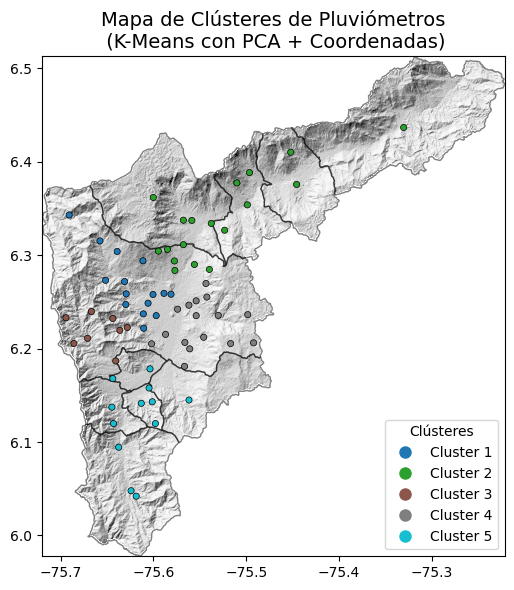

In [ ]:
# Asignar colores únicos para los clústeres
colors = plt.cm.get_cmap("tab10", 5)  # Paleta de colores para 5 clústeres
coords_gdf['Color'] = coords_gdf['Cluster'].apply(lambda x: colors(x))

# Crear el mapa
fig, ax = plt.subplots(figsize=(6, 6))

# Mostrar el hillshade
show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')

# Dibujar los límites administrativos
AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)

# Dibujar los puntos de los pluviómetros
coords_gdf.plot(ax=ax, color=coords_gdf['Color'], edgecolor='black', markersize=20, linewidth=0.5)

# Añadir leyenda
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=colors(i), markersize=10, label=f"Cluster {i+1}") for i in range(5)]
plt.legend(handles=handles, loc="lower right", title="Clústeres")

# Título y ajustes finales
plt.title("Mapa de Clústeres de Pluviómetros\n (K-Means con PCA + Coordenadas)", fontsize=14)
plt.tight_layout()
plt.show()


## Time-Series K-Means + Distancia Geográfica

In [ ]:
from tslearn.clustering import TimeSeriesKMeans
from geopy.distance import geodesic
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import geopandas as gpd
import matplotlib.pyplot as plt
from rasterio.plot import show
import rasterio as rio
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from scipy.spatial.distance import pdist, squareform

### Hacemos PCA para eliminar la redundancia en las series de tiempo y reducir las dimensionalidad, ya que se vuelve computcionalmente complejo.

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [ ]:
# Reducir la dimensionalidad de las series de tiempo
pca = PCA(n_components=10)  # Reduce a 10 componentes principales
series_reduced = pca.fit_transform(all_stations_df_10y_imputed.T)

scaler = TimeSeriesScalerMeanVariance()
series_scaled = scaler.fit_transform(series_reduced)

# Reaplica Time-Series K-Means
n_clusters = 5
ts_kmeans = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", random_state=42)
labels_time = ts_kmeans.fit_predict(series_pca)


# Agregar los resultados a las coordenadas
coords_df['Cluster_Time'] = labels_time

/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will 

In [ ]:
# Calcular la matriz de distancias geográficas
coords = coords_df[['Latitude', 'Longitude']].values
n_stations = coords.shape[0]

# Crear una matriz vacía para las distancias
dist_matrix_km = np.zeros((n_stations, n_stations))

# Llenar la matriz con distancias geodesic
for i in range(n_stations):
    for j in range(n_stations):
        dist_matrix_km[i, j] = geodesic(coords[i], coords[j]).kilometers

# Penalizar estaciones con alta distancia geográfica
geo_threshold_km = 5  # Define un umbral en kilómetros
adjusted_labels = labels_time.copy()

for i, row in enumerate(dist_matrix_km):
    if np.mean(row) > geo_threshold_km:
        adjusted_labels[i] = -1  # Reasigna estaciones alejadas a un clúster separado

# Actualizar los clústeres en la tabla de coordenadas
coords_df['Cluster_Time_final'] = adjusted_labels

In [ ]:
# Convertir el DataFrame de coordenadas a GeoDataFrame
coords_gdf_dtw = gpd.GeoDataFrame(
    coords_df,
    geometry=gpd.points_from_xy(coords_df.Longitude, coords_df.Latitude),
    crs="EPSG:4326"
)

/tmp/ipykernel_39839/1975089288.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap("tab10", n_clusters)


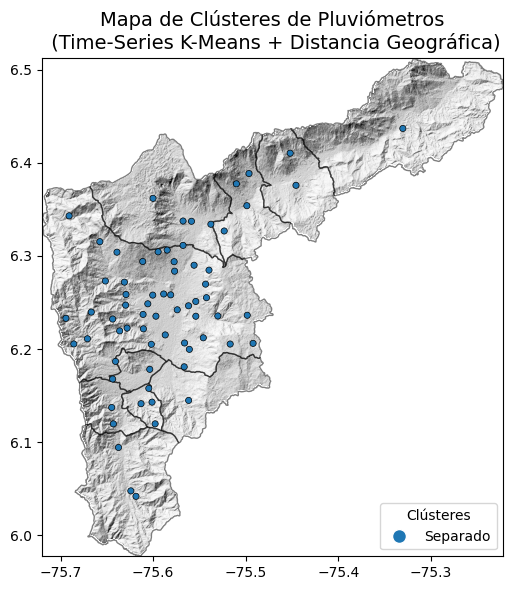

In [ ]:
# Asignar colores únicos para los clústeres
colors = plt.cm.get_cmap("tab10", n_clusters)
coords_gdf_dtw['Color'] = coords_gdf_dtw['Cluster_Time_final'].apply(lambda x: colors(x if x >= 0 else 0))  # Color para -1

# Crear el mapa
fig, ax = plt.subplots(figsize=(6, 6))

# Mostrar el hillshade
show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')

# Dibujar los límites administrativos
AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)

# Dibujar los puntos de los pluviómetros
coords_gdf_dtw.plot(ax=ax, color=coords_gdf_dtw['Color'], edgecolor='black', markersize=20, linewidth=0.5)

# Añadir leyenda
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=colors(i), markersize=10,
                       label=f"Cluster {i+1}" if i >= 0 else "Separado") for i in np.unique(adjusted_labels)]
plt.legend(handles=handles, loc="lower right", title="Clústeres")

# Título y ajustes finales
plt.title("Mapa de Clústeres de Pluviómetros\n (Time-Series K-Means + Distancia Geográfica)", fontsize=14)
plt.tight_layout()
plt.show()

## HDBSCAN con Peso Espacio-Tiempo

In [ ]:
from hdbscan import HDBSCAN


In [ ]:
series_scaled.shape

(69, 10, 1)

In [ ]:
coords_normalized.values.shape

(69, 2)

In [ ]:


# 📌 4. Fusionar Datos Temporales y Espaciales
# Asignamos un peso 2x a las series de tiempo y 1x a las coordenadas
features_combined = np.hstack((2 * series_pca, 1 * coords_normalized.values))

# 📌 5. Aplicar HDBSCAN para encontrar el número óptimo de clusters
hdbscan_model = HDBSCAN(min_cluster_size=5, min_samples=3)
labels_hdbscan = hdbscan_model.fit_predict(features_combined)

# 📌 6. Agregar los Clústeres a la Tabla de Coordenadas
coords_df['Cluster_HDBSCAN'] = labels_hdbscan


/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
# 📌 7. Calcular la Matriz de Distancias Geográficas
coords = coords_df[['Latitude', 'Longitude']].values
n_stations = coords.shape[0]

# Crear una matriz vacía para almacenar distancias
dist_matrix_km = np.zeros((n_stations, n_stations))

# Llenar la matriz con distancias geodesic
for i in range(n_stations):
    for j in range(n_stations):
        dist_matrix_km[i, j] = geodesic(coords[i], coords[j]).kilometers

# 📌 8. Penalizar Estaciones con Alta Distancia Geográfica
geo_threshold_km = 5  # Umbral de distancia en kilómetros
adjusted_labels_hdbscan = labels_hdbscan.copy()

for i, row in enumerate(dist_matrix_km):
    if np.mean(row) > geo_threshold_km:
        adjusted_labels_hdbscan[i] = -1  # Reasignar estaciones alejadas a un clúster separado

# Actualizar los Clústeres en la Tabla de Coordenadas
coords_df['Cluster_HDBSCAN_Final'] = adjusted_labels_hdbscan

In [ ]:
# 📌 9. Convertir el DataFrame en un GeoDataFrame
coords_gdf_hdbscan = gpd.GeoDataFrame(
    coords_df,
    geometry=gpd.points_from_xy(coords_df.Longitude, coords_df.Latitude),
    crs="EPSG:4326"
)

/tmp/ipykernel_39839/1376067926.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap("tab10", n_clusters)


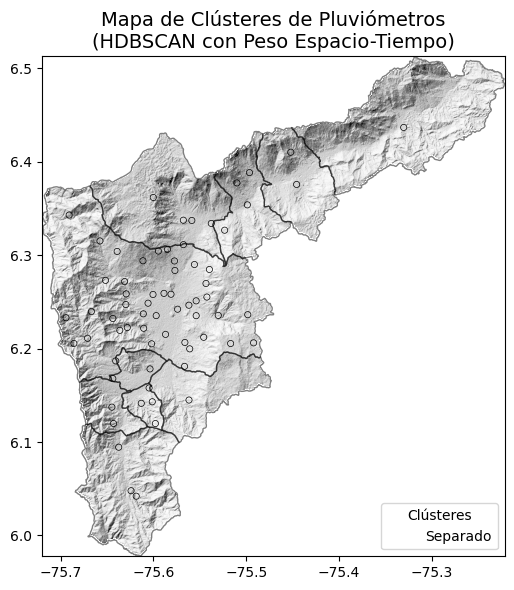

In [ ]:
# 📌 10. Generar el Mapa de Clústeres
# Definir colores únicos para los clústeres
unique_clusters = np.unique(adjusted_labels_hdbscan)
n_clusters = len(unique_clusters) if -1 not in unique_clusters else len(unique_clusters) - 1
colors = plt.cm.get_cmap("tab10", n_clusters)

coords_gdf_hdbscan['Color'] = coords_gdf_hdbscan['Cluster_HDBSCAN_Final'].apply(lambda x: colors(x if x >= 0 else 0))

# Crear el mapa
fig, ax = plt.subplots(figsize=(6, 6))

# Mostrar el hillshade
show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')

# Dibujar los límites administrativos
AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)

# Dibujar los puntos de los pluviómetros
coords_gdf_hdbscan.plot(ax=ax, color=coords_gdf_hdbscan['Color'], edgecolor='black', markersize=20, linewidth=0.5)

# 📌 11. Añadir Leyenda
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=colors(i), markersize=10,
                       label=f"Cluster {i+1}" if i >= 0 else "Separado") for i in unique_clusters]
plt.legend(handles=handles, loc="lower right", title="Clústeres")

# 📌 12. Ajustes Finales del Mapa
plt.title("Mapa de Clústeres de Pluviómetros\n(HDBSCAN con Peso Espacio-Tiempo)", fontsize=14)
plt.tight_layout()
plt.show()

## **Daily**

In [27]:
# 1. Obtén la lista de archivos diarios
daily_files = sorted(glob(daily_output + 'Daily_Est_*.csv'))

# 2. Extrae el número de estación desde el nombre de archivo
stations_with_paths = [
    (int(os.path.basename(file).split('_')[-1].split('.')[0]), file) 
    for file in daily_files
]

# 3. Ordena la lista por número de estación
stations_with_paths_sorted = sorted(stations_with_paths, key=lambda x: x[0])

# 4. Filtra las estaciones de SIATA (excluyendo las últimas 16, que asumes son EPM)
siata_stations_with_paths = stations_with_paths_sorted[:-16]

# 5. Carga y renombra los datos de cada estación
data_frames = []
station_numbers = []

for station_number, file in siata_stations_with_paths:
    # Lee el archivo CSV usando 'Fecha' como índice de tipo datetime
    station_data = pd.read_csv(file, index_col='Fecha', parse_dates=True)

    # Intenta renombrar la columna de precipitación como 'Est_{station_number}'
    if 'P' in station_data.columns:
        station_data.rename(columns={'P': f'Est_{station_number}'}, inplace=True)
    else:
        # Si no existe la columna 'P', busca alguna columna que contenga 'P' en su nombre
        precip_column = [col for col in station_data.columns if 'P' in col.upper()]
        if precip_column:
            station_data.rename(
                columns={precip_column[0]: f'Est_{station_number}'}, 
                inplace=True
            )
        else:
            print(f"Advertencia: No se encontró columna de precipitación en {file}")
            continue

    data_frames.append(station_data)
    station_numbers.append(station_number)

# 6. Concatena todos los DataFrames, uniendo por índice (outer join)
all_stations_df = pd.concat(data_frames, axis=1, join='outer')

#### Porcentaje de datos faltantes

In [28]:
# Dejar estaciones con 10 o más años de datos
min_hours = 10 * 365
# Filtra columnas (estaciones) que tengan al menos 'min_hours' datos válidos (no nulos)
all_stations_df_10y = all_stations_df.loc[:, all_stations_df.count() >= min_hours]

# Filtrar filas desde '2013-01-01' hasta el final de las series
all_stations_df_10y = all_stations_df_10y.loc['2013-01-01':]

# Mostrar la cantidad de datos faltantes por estación
missing_values = all_stations_df_10y.isna().sum()
total_days = len(all_stations_df_10y)
missing_percentage = (missing_values / total_days) * 100


print("Porcentaje de datos faltantes (NaN) por estación:")
# 1. Creamos el DataFrame con ambas series
df_missing = pd.DataFrame({
    'Datos_faltantes': missing_values,
    'Porcentaje_NaN': missing_percentage
})

# 2. Redondear el porcentaje a 2 decimales
df_missing['Porcentaje_NaN'] = df_missing['Porcentaje_NaN'].round(2)

# 3. Mostrar el resultado
print(df_missing)

Porcentaje de datos faltantes (NaN) por estación:
         Datos_faltantes  Porcentaje_NaN
Est_1                138            3.26
Est_2                105            2.48
Est_3                189            4.47
Est_4                241            5.69
Est_5                 98            2.32
...                  ...             ...
Est_76               324            7.66
Est_81               215            5.08
Est_88               472           11.15
Est_89               410            9.69
Est_211              201            4.75

[70 rows x 2 columns]


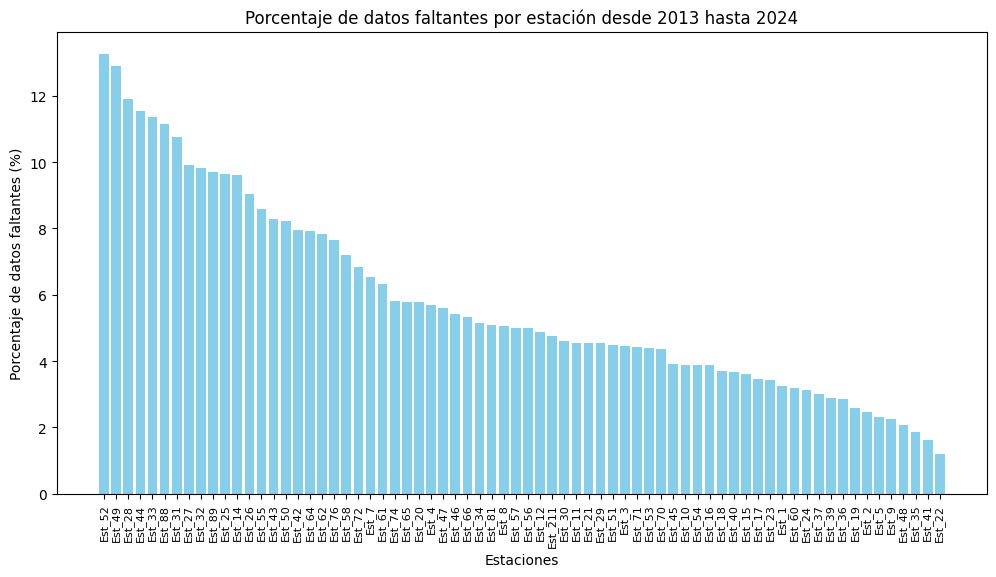

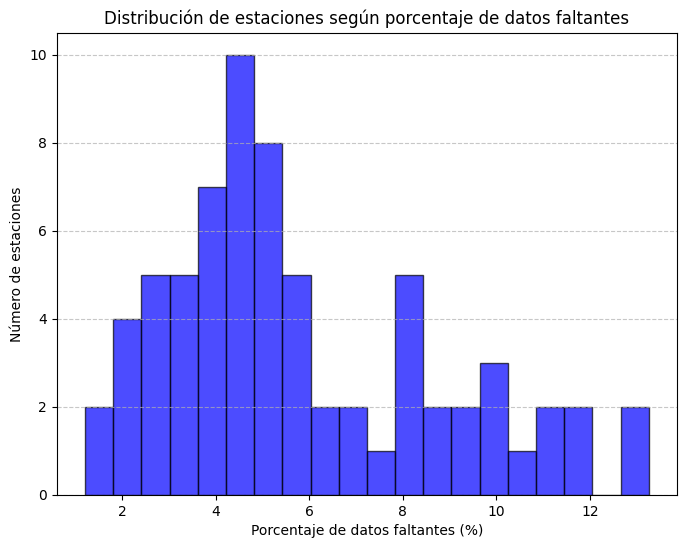

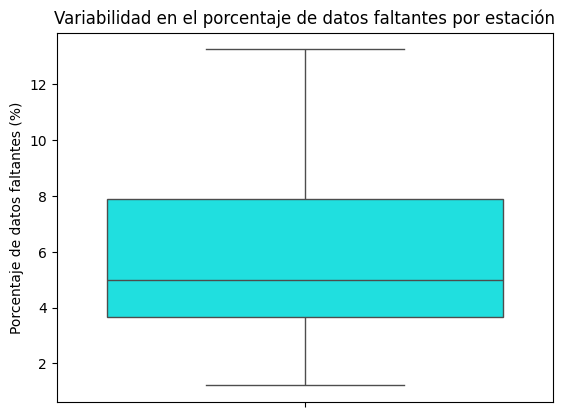

In [13]:
# Hacer un gráfico de barras con los datos faltantes
df_missing_sorted = df_missing.sort_values(by='Porcentaje_NaN', ascending=False)

plt.figure(figsize=(12, 6))
plt.bar(df_missing_sorted.index, df_missing_sorted['Porcentaje_NaN'], color='skyblue')
plt.xticks(rotation=90, fontsize=8)
plt.ylabel("Porcentaje de datos faltantes (%)")
plt.xlabel("Estaciones")
plt.title("Porcentaje de datos faltantes por estación desde 2013 hasta 2024")
plt.show()


# Hacer un histograma de los porcentajes de datos faltantes

plt.figure(figsize=(8, 6))
plt.hist(df_missing['Porcentaje_NaN'], bins=20, color='blue', edgecolor='black', alpha=0.7)
plt.xlabel("Porcentaje de datos faltantes (%)")
plt.ylabel("Número de estaciones")
plt.title("Distribución de estaciones según porcentaje de datos faltantes")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# Hacer un boxplot de los porcentajes de datos faltantes
sns.boxplot(y=df_missing['Porcentaje_NaN'], color="cyan")
plt.ylabel("Porcentaje de datos faltantes (%)")
plt.title("Variabilidad en el porcentaje de datos faltantes por estación")
plt.show()

In [29]:
def imputar_nan_diario(df):
    """
    Rellena los valores NaN en un DataFrame de series temporales diarias.
    
    1. Interpola valores ausentes de hasta un límite de días consecutivos (por ejemplo, 7).
    2. Rellena los NaN restantes con la media de cada día del año (dayofyear).

    Args:
        df (pd.DataFrame): 
            DataFrame con índice de tipo fecha (diario) y 
            columnas correspondientes a distintas series (por ejemplo, estaciones).
    
    Returns:
        pd.DataFrame: DataFrame con los NaN imputados.
    """
    df_imputado = df.copy()
    
    # Paso 1: Interpola huecos de hasta 'limit' días consecutivos
    # (Puedes ajustar limit según tus necesidades: 7, 5, 3, etc.)
    df_imputado = df_imputado.interpolate(method='time', limit=2, limit_direction='both')
    
    # Paso 2: Rellenar lo que quede con la media de cada día del año
    # Creamos una columna auxiliar con el día del año
    df_imputado['DiaDelAnio'] = df_imputado.index.dayofyear
    
    # Calculamos la media para cada día del año; transform('mean') aplica 
    # la operación columna por columna dentro de cada grupo.
    medias_por_dia = df_imputado.groupby('DiaDelAnio').transform('mean')
    
    # Rellenamos los NaN con esos valores medios
    df_imputado = df_imputado.fillna(medias_por_dia)
    
    # Eliminamos la columna auxiliar
    df_imputado.drop(columns=['DiaDelAnio'], inplace=True)
    
    return df_imputado

In [30]:
all_stations_df_10y_imputed = imputar_nan_diario(all_stations_df_10y)


missing_values_2 = all_stations_df_10y_imputed.isna().sum()
total_days = len(all_stations_df_10y_imputed)
missing_percentage = (missing_values_2 / total_days) * 100


print("Porcentaje de datos faltantes (NaN) por estación:")
# 1. Creamos el DataFrame con ambas series
df_missing = pd.DataFrame({
    'Datos_faltantes': missing_values_2,
    'Porcentaje_NaN': missing_percentage
})

# 2. Redondear el porcentaje a 2 decimales
df_missing['Porcentaje_NaN'] = df_missing['Porcentaje_NaN'].round(2)

# 3. Mostrar el resultado
print(df_missing)



Porcentaje de datos faltantes (NaN) por estación:
         Datos_faltantes  Porcentaje_NaN
Est_1                  0             0.0
Est_2                  0             0.0
Est_3                  0             0.0
Est_4                  0             0.0
Est_5                  0             0.0
...                  ...             ...
Est_76                 0             0.0
Est_81                 0             0.0
Est_88                 0             0.0
Est_89                 0             0.0
Est_211                0             0.0

[70 rows x 2 columns]


### Hierarchical clustering

Text(0, 0.5, 'Distancia')

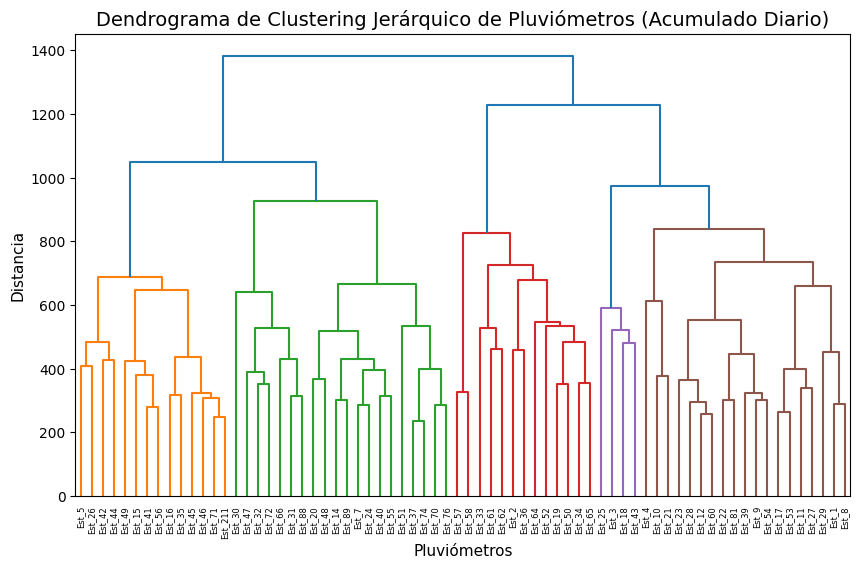

In [16]:
Z = sch.linkage(all_stations_df_10y_imputed.T, method='ward', metric='euclidean')

plt.figure(figsize=(10, 6))

dendrogram = sch.dendrogram(
    Z,
    labels=all_stations_df_10y_imputed.columns,
    leaf_rotation=90, 
    leaf_font_size=6
)

plt.title("Dendrograma de Clustering Jerárquico de Pluviómetros (Acumulado Diario)", fontsize=14)
plt.xlabel("Pluviómetros", fontsize=11)
plt.ylabel("Distancia", fontsize=11)

### Número óptimo de clusters: 
### Método del codo y Silhouette Score

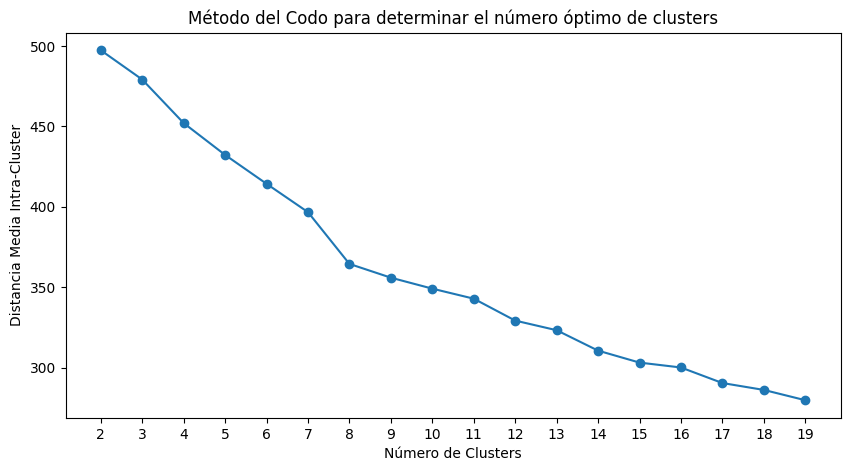

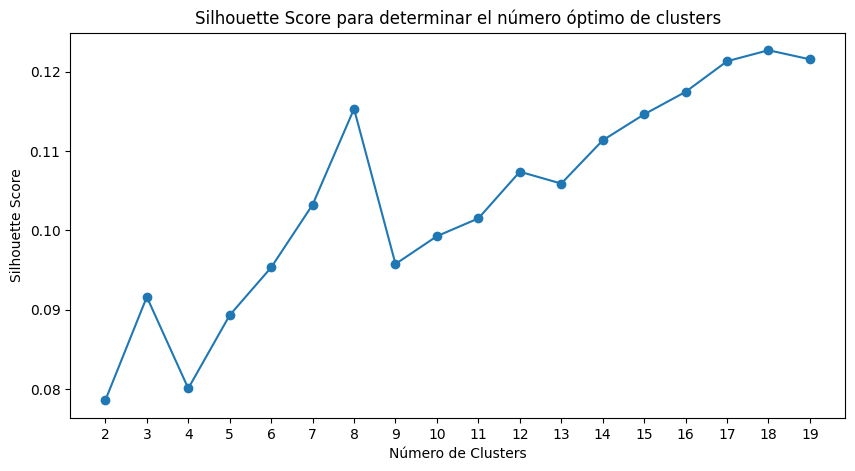

In [17]:
mean_distances = []
silhouette_scores = []
range_n_clusters = range(2, 20)

for n_clusters in range_n_clusters:
    clustering = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
    labels = clustering.fit_predict(all_stations_df_10y_imputed.T)
    cluster_distances = []
    for i in range(n_clusters):
        cluster_points = all_stations_df_10y_imputed.T[labels == i]
        if len(cluster_points) > 1:
            distances = cdist(cluster_points, cluster_points, 'euclidean')
            cluster_distances.append(np.mean(distances))
    mean_distances.append(np.mean(cluster_distances))
    silhouette_avg = silhouette_score(all_stations_df_10y_imputed.T, labels)
    silhouette_scores.append(silhouette_avg)

plt.figure(figsize=(10, 5))
plt.plot(range_n_clusters, mean_distances, marker='o')
plt.title('Método del Codo para determinar el número óptimo de clusters')
plt.xticks(range_n_clusters)
plt.xlabel('Número de Clusters')
plt.ylabel('Distancia Media Intra-Cluster')
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.title('Silhouette Score para determinar el número óptimo de clusters')
plt.xticks(range_n_clusters)
plt.xlabel('Número de Clusters')
plt.ylabel('Silhouette Score')
plt.show()

### Gap Statistic y Davies-Bouldin Index

In [18]:
from sklearn.cluster import KMeans
import numpy as np

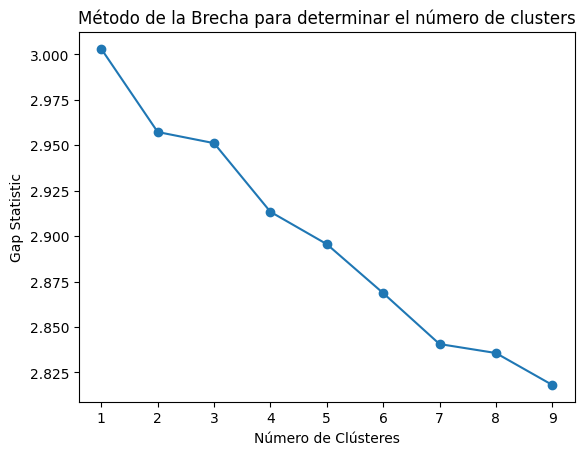

In [19]:
def gap_statistic(X, n_refs=10, max_clusters=15):
    import numpy as np
    from sklearn.cluster import KMeans
    
    gaps = np.zeros(max_clusters-1)
    results = np.zeros((max_clusters-1, n_refs))
    
    for k in range(1, max_clusters):
        km = KMeans(n_clusters=k)
        km.fit(X)
        disp = np.mean(np.min(cdist(X, km.cluster_centers_, 'euclidean'), axis=1))
        
        for i in range(n_refs):
            random_ref = np.random.random_sample(size=X.shape)
            km.fit(random_ref)
            ref_disp = np.mean(np.min(cdist(random_ref, km.cluster_centers_, 'euclidean'), axis=1))
            results[k-1, i] = np.log(ref_disp)
        
        gaps[k-1] = np.log(disp) - np.mean(results[k-1, :])
    
    return gaps

gaps = gap_statistic(all_stations_df_10y_imputed.T.values, max_clusters=10)
plt.plot(range(1, 10), gaps, marker='o')
plt.xlabel('Número de Clústeres')
plt.ylabel('Gap Statistic')
plt.title('Método de la Brecha para determinar el número de clusters')
plt.show()

In [20]:
from sklearn.metrics import davies_bouldin_score

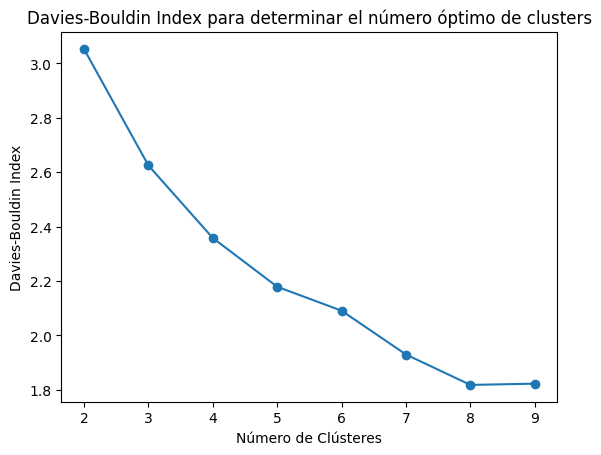

In [21]:
davies_bouldin = []
for k in range(2, 10):
    clustering = AgglomerativeClustering(n_clusters=k)
    labels = clustering.fit_predict(all_stations_df_10y_imputed.T)
    score = davies_bouldin_score(all_stations_df_10y_imputed.T, labels)
    davies_bouldin.append(score)

plt.plot(range(2, 10), davies_bouldin, marker='o')
plt.xlabel('Número de Clústeres')
plt.ylabel('Davies-Bouldin Index')
plt.title('Davies-Bouldin Index para determinar el número óptimo de clusters')
plt.show()

### Validación cruzada con estabilidad de los clústeres

In [22]:
from sklearn.utils import resample

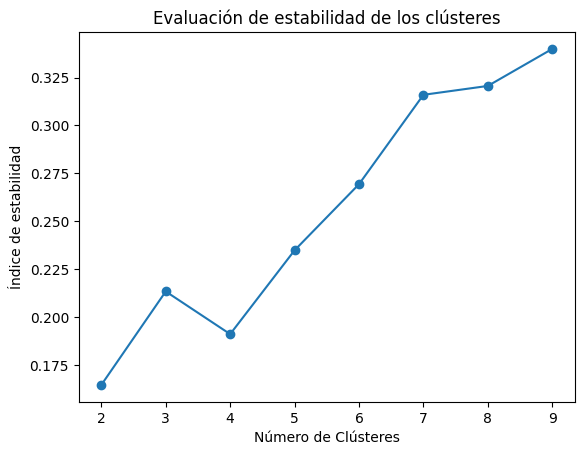

In [23]:
def stability_index(X, max_clusters=10, n_bootstrap=10):
    stability_scores = []
    
    for k in range(2, max_clusters):
        labels_sets = []
        scores = []
        
        for _ in range(n_bootstrap):
            # Realiza el remuestreo con el 90% de los datos
            X_sample = resample(X, replace=True, n_samples=int(0.9 * X.shape[0]), random_state=42)
            
            # Aplica clustering
            clustering = AgglomerativeClustering(n_clusters=k)
            labels = clustering.fit_predict(X_sample)
            
            # Guarda las etiquetas para análisis
            labels_sets.append((X_sample, labels))
        
        # Calcula silhouette_score solo sobre el subconjunto de datos correspondiente
        for X_sub, labels in labels_sets:
            if len(np.unique(labels)) > 1:  # silhouette_score requiere al menos 2 clústeres
                score = silhouette_score(X_sub, labels)
                scores.append(score)
        
        # Guarda el promedio de silhouette_score
        stability_scores.append(np.mean(scores) if scores else np.nan)  

    return stability_scores

stability_scores = stability_index(all_stations_df_10y_imputed.T.values)
plt.plot(range(2, 10), stability_scores, marker='o')
plt.xlabel('Número de Clústeres')
plt.ylabel('Índice de estabilidad')
plt.title('Evaluación de estabilidad de los clústeres')
plt.show()


### Mapa de cluster

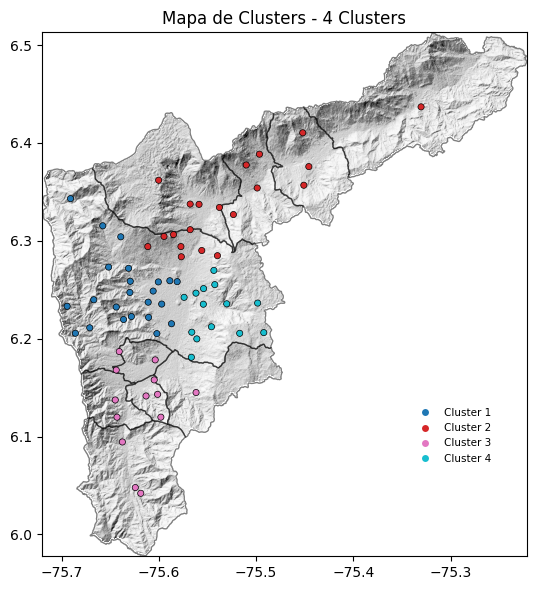

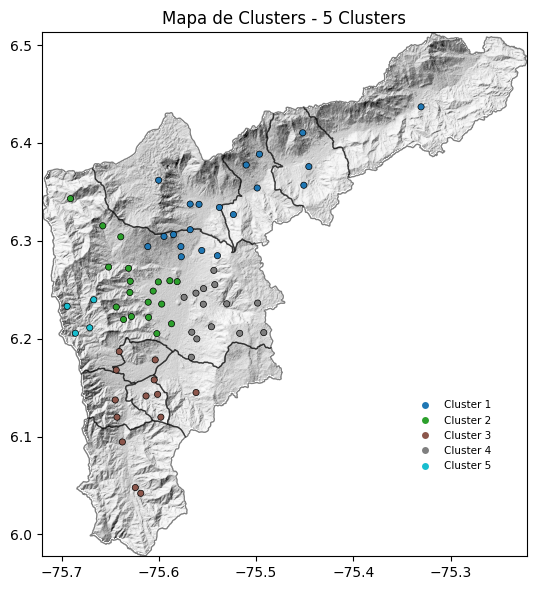

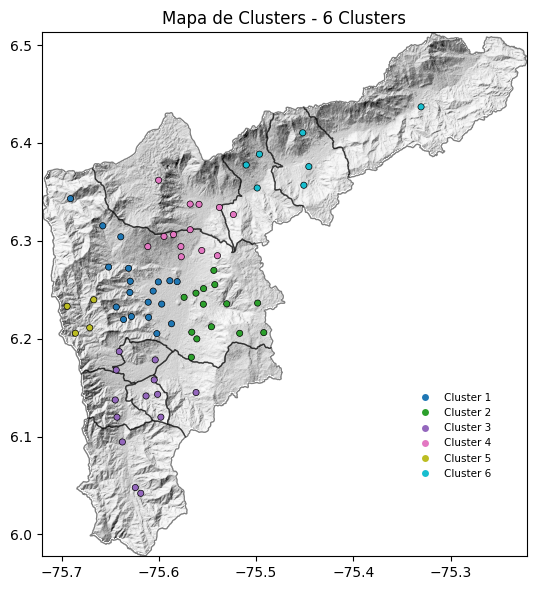

In [24]:

# 📌 Asegurar que los identificadores de estaciones coincidan con los datos
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']
all_stations_df_10y_imputed.columns = (
    all_stations_df_10y_imputed.columns
    .str.replace("Est_", "")
    .astype(int)
)

# 📌 Función para graficar el mapa de clusters
def plot_cluster_map(n_clusters):
    """
    Genera y grafica un mapa con la clasificación de estaciones en clusters.

    Parámetros:
    - n_clusters (int): Número de clusters a calcular.
    """
    # 📌 Aplicar Agglomerative Clustering
    hc = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
    labels_hc = hc.fit_predict(all_stations_df_10y_imputed.T)

    # 📌 Asignar colores a los clusters
    colores_base = plt.rcParams['axes.prop_cycle'].by_key()['color']
    colores = colores_base * (n_clusters // len(colores_base)) + colores_base[:n_clusters % len(colores_base)]

    # 📌 Crear nueva columna con los clusters en el GeoDataFrame
    for i in np.unique(labels_hc):
        cluster = all_stations_df_10y_imputed.columns[labels_hc == i]
        pluvios_shp_c.loc[cluster, 'color'] = colores[i]
        pluvios_shp_c.loc[cluster, 'cluster_name'] = f'Cluster {i+1}'

    # 📌 Generar el mapa
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)
    pluvios_shp_c.plot(ax=ax, c=pluvios_shp_c['color'], edgecolor='k', markersize=20, linewidth=0.5,
                       column="cluster_name",
                       categorical=True,
                       legend=True,
                       legend_kwds={"loc": "center left", "bbox_to_anchor": (0.75, 0.23), "fontsize": 7.5,
                                    "markerscale": 0.5, "frameon": False})
    plt.title(f"Mapa de Clusters - {n_clusters} Clusters", fontsize=12)
    plt.tight_layout()
    plt.show()


# 📌 Generar mapas para 4, 5 y 6 clusters
for n in [4, 5, 6]:
    plot_cluster_map(n)

## **CON MATRIZ DE VECINDAD**

In [25]:
import scipy.sparse as sp
from scipy.spatial import Delaunay
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph, radius_neighbors_graph
from rasterio.plot import show
from pyproj import Transformer

In [31]:
# Cargar coordenadas
coords_df = pd.read_csv("../../DATA/coords_SIATA.csv", index_col="Codigo")
# 📌 Convertir coordenadas geográficas a UTM
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3116", always_xy=True)
coords_df['X'], coords_df['Y'] = zip(*coords_df.apply(lambda row: transformer.transform(row['Longitude'], row['Latitude']), axis=1))


# 📌 Asegurar que los identificadores de estaciones coincidan con los datos
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']
all_stations_df_10y_imputed.columns = (
    all_stations_df_10y_imputed.columns
    .str.replace("Est_", "")
    .astype(int)
)

# Validar que los índices coincidan entre las coordenadas y las series de tiempo
all_stations_df_10y_imputed.columns = all_stations_df_10y_imputed.columns.astype(int)
coords_df = coords_df.loc[all_stations_df_10y_imputed.columns]

# 📌 Filtrar el GeoDataFrame para que solo contenga las estaciones analizadas
pluvios_shp_c = pluvios_shp_c.loc[all_stations_df_10y_imputed.columns]

In [32]:
# 📌 Función para construir la matriz de conectividad
def build_connectivity_matrix(method, param):
    """
    Construye la matriz de conectividad para el clustering.

    Parámetros:
    - method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Número de vecinos para k-NN o radio en metros.

    Retorna:
    - Matriz de conectividad.
    """
    if method == 'kneighbors':
        return kneighbors_graph(coords_df[['X', 'Y']], n_neighbors=int(param), include_self=False)
    elif method == 'radius':
        return radius_neighbors_graph(coords_df[['X', 'Y']], radius=float(param), include_self=False)
    elif method == 'delaunay':
        tri = Delaunay(coords_df[['X', 'Y']].values)
        n_points = len(coords_df)
        connectivity_matrix = sp.lil_matrix((n_points, n_points))
        for simplex in tri.simplices:
            for i in range(3):
                for j in range(i + 1, 3):
                    connectivity_matrix[simplex[i], simplex[j]] = 1
                    connectivity_matrix[simplex[j], simplex[i]] = 1
        return connectivity_matrix.tocsr()
    else:
        raise ValueError("Método no reconocido. Usa 'kneighbors', 'radius' o 'delaunay'.")

# 📌 Función para graficar el mapa de clusters
def plot_cluster_map(n_clusters, connectivity_method='kneighbors', param=5):
    """
    Genera y grafica un mapa con la clasificación de estaciones en clusters.

    Parámetros:
    - n_clusters (int): Número de clusters a calcular.
    - connectivity_method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Parámetro de conectividad (número de vecinos o radio en metros).
    """
    # 📌 Construir matriz de conectividad
    connectivity = build_connectivity_matrix(connectivity_method, param)

    # 📌 Aplicar Agglomerative Clustering
    hc = AgglomerativeClustering(n_clusters=n_clusters, connectivity=connectivity, linkage='ward')
    labels_hc = hc.fit_predict(all_stations_df_10y_imputed.T)

    # 📌 Asignar clusters al GeoDataFrame
    pluvios_shp_c['cluster'] = labels_hc

    # 📌 Asignar colores a los clusters
    colores_base = plt.rcParams['axes.prop_cycle'].by_key()['color']
    colores = colores_base * (n_clusters // len(colores_base)) + colores_base[:n_clusters % len(colores_base)]
    for i in np.unique(labels_hc):
        pluvios_shp_c.loc[pluvios_shp_c['cluster'] == i, 'color'] = colores[i]

    # 📌 Generar el mapa
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)
    pluvios_shp_c.plot(ax=ax, c=pluvios_shp_c['color'], edgecolor='k', markersize=20, linewidth=0.5,
                       column="cluster",
                       categorical=True,
                       legend=True,
                       legend_kwds={"loc": "center left", "bbox_to_anchor": (0.75, 0.23), "fontsize": 7.5,
                                    "markerscale": 0.5, "frameon": False})
    
    plt.title(f"Mapa de Clusters ({connectivity_method} - {param})", fontsize=12)
    plt.tight_layout()
    plt.show()

Haciendo mapas con método de conectividad: kneighbors y parámetro 5
Generando mapa con 4 clusters


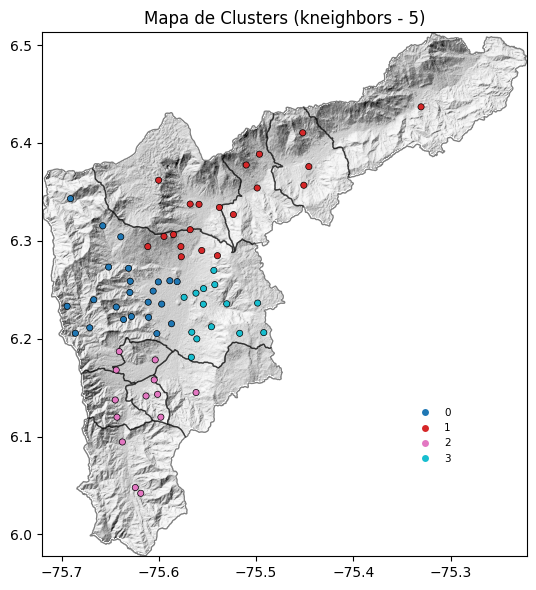

Generando mapa con 5 clusters


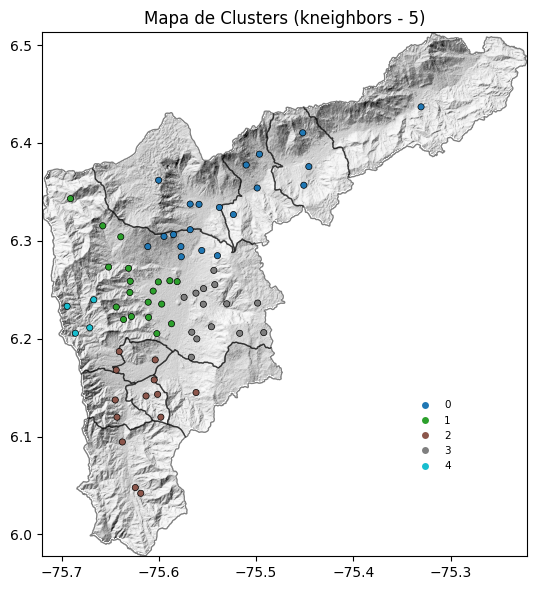

Generando mapa con 6 clusters


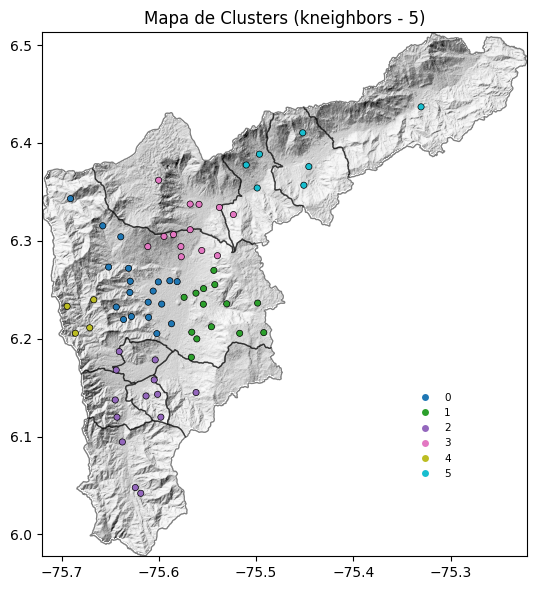

Haciendo mapas con método de conectividad: radius y parámetro 5000
Generando mapa con 4 clusters


/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:325: UserWarning: the number of connected components of the connectivity matrix is 4 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


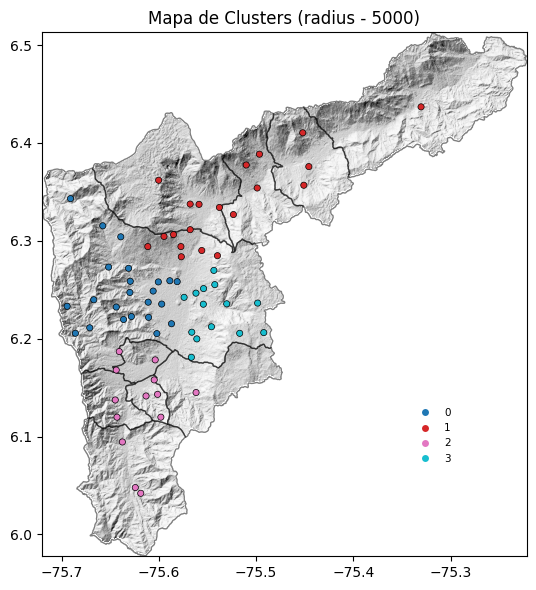

Generando mapa con 5 clusters


/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:325: UserWarning: the number of connected components of the connectivity matrix is 4 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


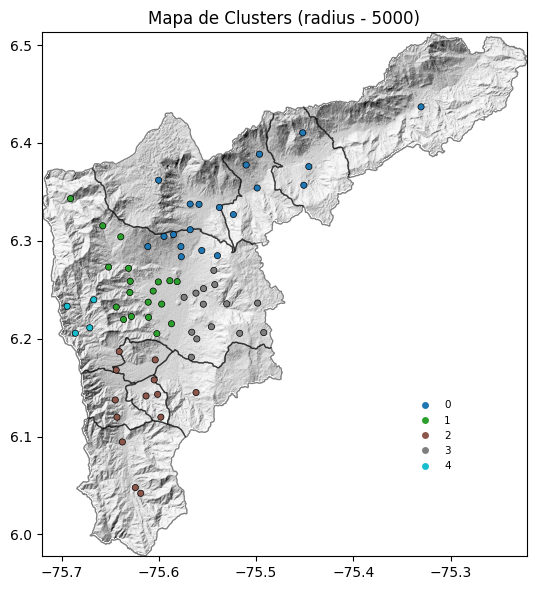

Generando mapa con 6 clusters


/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:325: UserWarning: the number of connected components of the connectivity matrix is 4 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


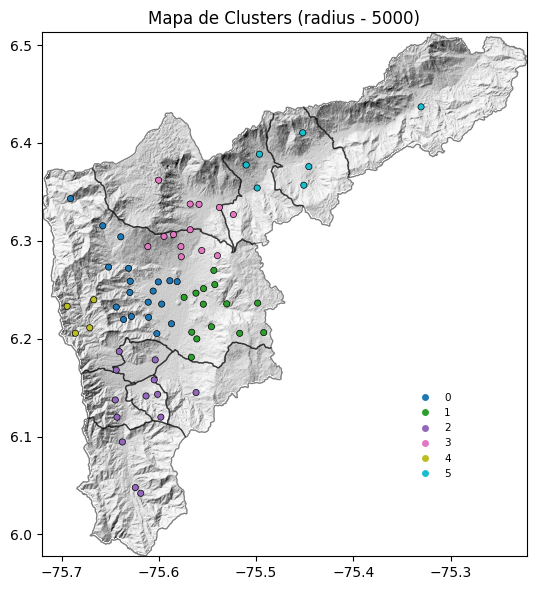

Haciendo mapas con método de conectividad: delaunay y parámetro None
Generando mapa con 4 clusters


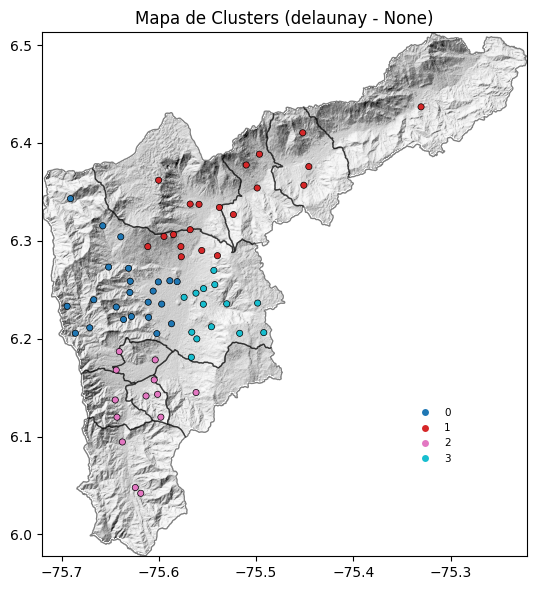

Generando mapa con 5 clusters


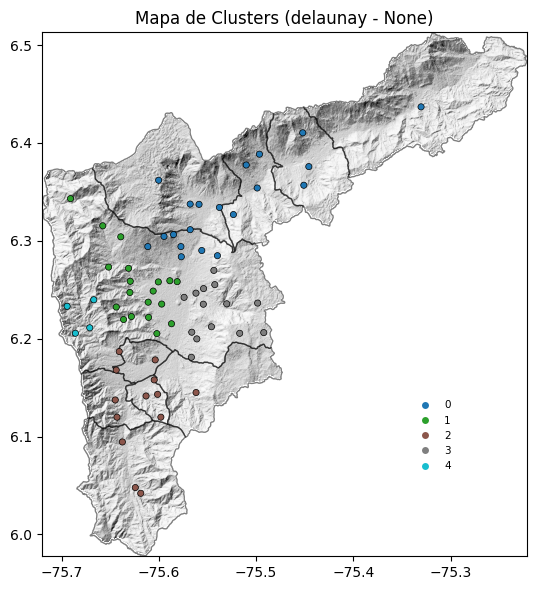

Generando mapa con 6 clusters


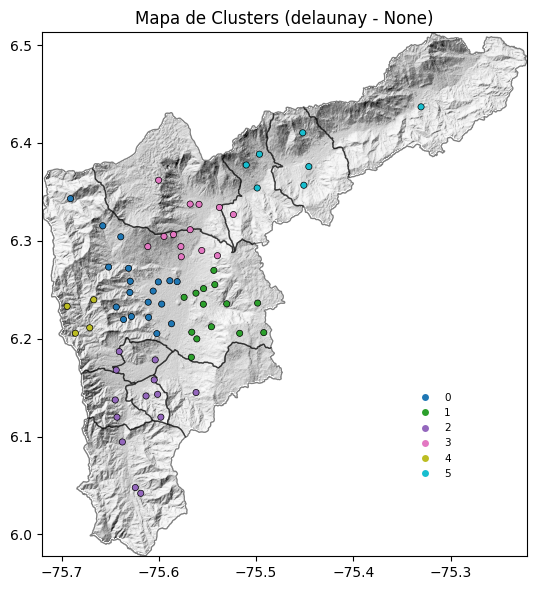

In [33]:
# 📌 Generar mapas para 4, 5 y 6 clusters con distintas matrices de conectividad
for method, param in [('kneighbors', 5), ('radius', 5000), ('delaunay', None)]:
    print(f'Haciendo mapas con método de conectividad: {method} y parámetro {param}')
    for n in [4, 5, 6]:
        print(f"Generando mapa con {n} clusters")
        plot_cluster_map(n_clusters=n, connectivity_method=method, param=param)

## **Montly**

In [4]:
# 1. Obtén la lista de archivos diarios
daily_files = sorted(glob(monthly_output + 'Monthly_Est_*.csv'))

# 2. Extrae el número de estación desde el nombre de archivo
stations_with_paths = [
    (int(os.path.basename(file).split('_')[-1].split('.')[0]), file) 
    for file in daily_files
]

# 3. Ordena la lista por número de estación
stations_with_paths_sorted = sorted(stations_with_paths, key=lambda x: x[0])

# 4. Filtra las estaciones de SIATA (excluyendo las últimas 16, que asumes son EPM)
siata_stations_with_paths = stations_with_paths_sorted[:-16]

# 5. Carga y renombra los datos de cada estación
data_frames = []
station_numbers = []

for station_number, file in siata_stations_with_paths:
    # Lee el archivo CSV usando 'Fecha' como índice de tipo datetime
    station_data = pd.read_csv(file, index_col='Fecha', parse_dates=True)

    # Intenta renombrar la columna de precipitación como 'Est_{station_number}'
    if 'P' in station_data.columns:
        station_data.rename(columns={'P': f'Est_{station_number}'}, inplace=True)
    else:
        # Si no existe la columna 'P', busca alguna columna que contenga 'P' en su nombre
        precip_column = [col for col in station_data.columns if 'P' in col.upper()]
        if precip_column:
            station_data.rename(
                columns={precip_column[0]: f'Est_{station_number}'}, 
                inplace=True
            )
        else:
            print(f"Advertencia: No se encontró columna de precipitación en {file}")
            continue

    data_frames.append(station_data)
    station_numbers.append(station_number)

# 6. Concatena todos los DataFrames, uniendo por índice (outer join)
all_stations_df = pd.concat(data_frames, axis=1, join='outer')

In [5]:
# Dejar estaciones con 10 o más años de datos
min_hours = 10 * 12  # ~87,600

# Filtra columnas (estaciones) que tengan al menos 'min_hours' datos válidos (no nulos)
all_stations_df_10y = all_stations_df.loc[:, all_stations_df.count() >= min_hours]

# Filtrar filas desde '2013-01-01' hasta el final de las series
all_stations_df_10y = all_stations_df_10y.loc['2013-01-01':]

# Mostrar la cantidad de datos faltantes por estación
missing_values = all_stations_df_10y.isna().sum()
total_days = len(all_stations_df_10y)
missing_percentage = (missing_values / total_days) * 100


print("Porcentaje de datos faltantes (NaN) por estación:")
# 1. Creamos el DataFrame con ambas series
df_missing = pd.DataFrame({
    'Datos_faltantes': missing_values,
    'Porcentaje_NaN': missing_percentage
})

# 2. Redondear el porcentaje a 2 decimales
df_missing['Porcentaje_NaN'] = df_missing['Porcentaje_NaN'].round(2)

# 3. Mostrar el resultado
print(df_missing)

Porcentaje de datos faltantes (NaN) por estación:
         Datos_faltantes  Porcentaje_NaN
Est_1                  1            0.71
Est_2                  1            0.71
Est_3                  0            0.00
Est_4                  1            0.71
Est_5                  0            0.00
...                  ...             ...
Est_76                 6            4.29
Est_81                 5            3.57
Est_88                10            7.14
Est_89                10            7.14
Est_211                3            2.14

[70 rows x 2 columns]


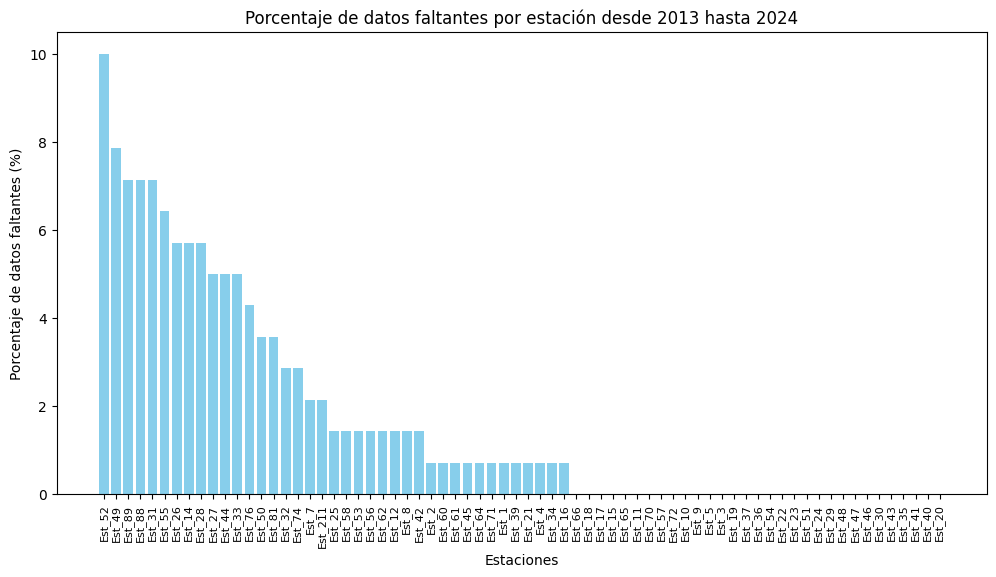

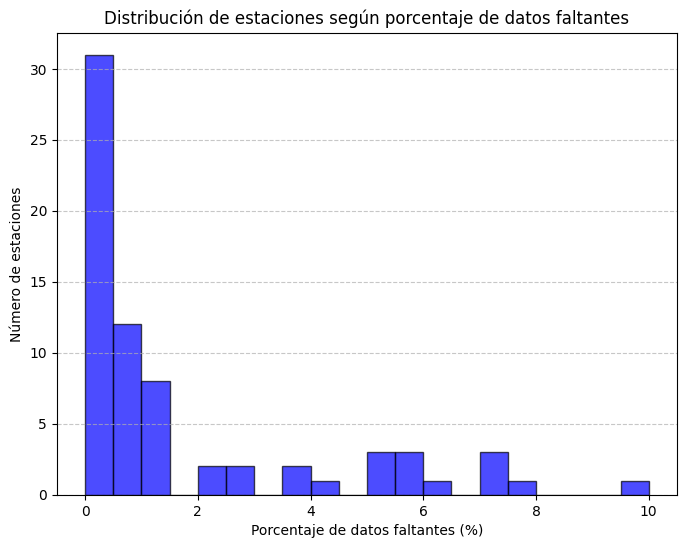

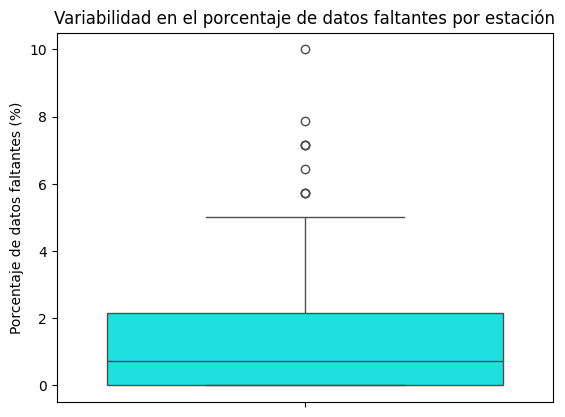

In [6]:
# Hacer un gráfico de barras con los datos faltantes
df_missing_sorted = df_missing.sort_values(by='Porcentaje_NaN', ascending=False)

plt.figure(figsize=(12, 6))
plt.bar(df_missing_sorted.index, df_missing_sorted['Porcentaje_NaN'], color='skyblue')
plt.xticks(rotation=90, fontsize=8)
plt.ylabel("Porcentaje de datos faltantes (%)")
plt.xlabel("Estaciones")
plt.title("Porcentaje de datos faltantes por estación desde 2013 hasta 2024")
plt.show()


# Hacer un histograma de los porcentajes de datos faltantes

plt.figure(figsize=(8, 6))
plt.hist(df_missing['Porcentaje_NaN'], bins=20, color='blue', edgecolor='black', alpha=0.7)
plt.xlabel("Porcentaje de datos faltantes (%)")
plt.ylabel("Número de estaciones")
plt.title("Distribución de estaciones según porcentaje de datos faltantes")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# Hacer un boxplot de los porcentajes de datos faltantes
sns.boxplot(y=df_missing['Porcentaje_NaN'], color="cyan")
plt.ylabel("Porcentaje de datos faltantes (%)")
plt.title("Variabilidad en el porcentaje de datos faltantes por estación")
plt.show()

In [7]:
def imputar_nan_mensual(df):
    """
    Rellena los valores NaN en un DataFrame de series temporales mensuales.
    
    Para cada mes (por ejemplo, enero, febrero, etc.), se reemplazan los valores faltantes 
    con el promedio de ese mes calculado a partir de los datos de los otros años.
    
    Args:
        df (pd.DataFrame): 
            DataFrame con índice de tipo fecha (mensual) y 
            columnas correspondientes a distintas series (por ejemplo, estaciones).
    
    Returns:
        pd.DataFrame: DataFrame con los NaN imputados.
    """
    df_imputado = df.copy()
    
    # Creamos una columna auxiliar que contiene el mes de cada fecha
    df_imputado['Mes'] = df_imputado.index.month
    
    # Calculamos la media para cada mes, aplicándola columna por columna en cada grupo
    medias_por_mes = df_imputado.groupby('Mes').transform('mean')
    
    # Rellenamos los NaN con la media calculada para cada mes
    df_imputado = df_imputado.fillna(medias_por_mes)
    
    # Eliminamos la columna auxiliar
    df_imputado.drop(columns=['Mes'], inplace=True)
    
    return df_imputado

In [8]:
all_stations_df_10y_imputed = imputar_nan_mensual(all_stations_df_10y)

missing_values_2 = all_stations_df_10y_imputed.isna().sum()
total_days = len(all_stations_df_10y_imputed)
missing_percentage = (missing_values_2 / total_days) * 100


print("Porcentaje de datos faltantes (NaN) por estación:")
# 1. Creamos el DataFrame con ambas series
df_missing = pd.DataFrame({
    'Datos_faltantes': missing_values_2,
    'Porcentaje_NaN': missing_percentage
})

# 2. Redondear el porcentaje a 2 decimales
df_missing['Porcentaje_NaN'] = df_missing['Porcentaje_NaN'].round(2)

# 3. Mostrar el resultado
print(df_missing)

Porcentaje de datos faltantes (NaN) por estación:
         Datos_faltantes  Porcentaje_NaN
Est_1                  0             0.0
Est_2                  0             0.0
Est_3                  0             0.0
Est_4                  0             0.0
Est_5                  0             0.0
...                  ...             ...
Est_76                 0             0.0
Est_81                 0             0.0
Est_88                 0             0.0
Est_89                 0             0.0
Est_211                0             0.0

[70 rows x 2 columns]


### **Hierarchical clustering**

Text(0, 0.5, 'Distancia')

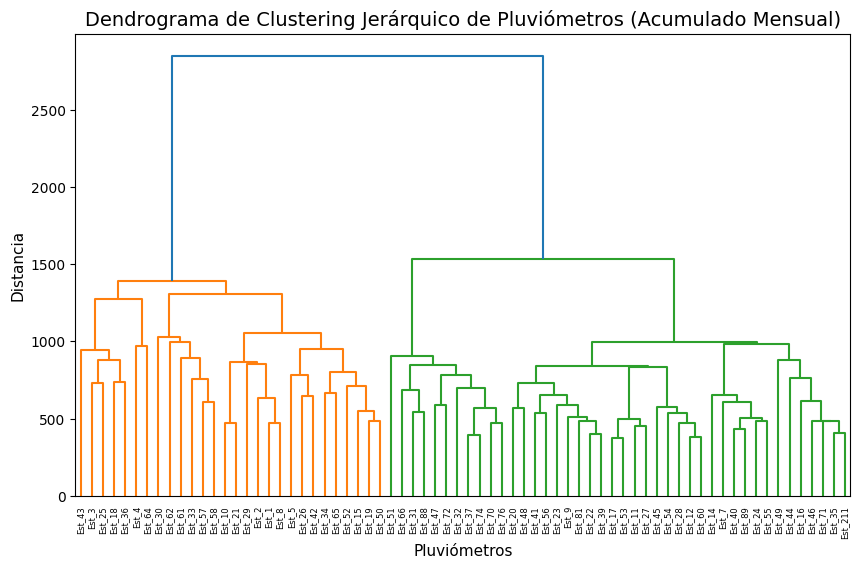

In [9]:
Z = sch.linkage(all_stations_df_10y_imputed.T, method='ward', metric='euclidean')

plt.figure(figsize=(10, 6))

dendrogram = sch.dendrogram(
    Z,
    labels=all_stations_df_10y_imputed.columns,
    leaf_rotation=90, 
    leaf_font_size=6
)

plt.title("Dendrograma de Clustering Jerárquico de Pluviómetros (Acumulado Mensual)", fontsize=14)
plt.xlabel("Pluviómetros", fontsize=11)
plt.ylabel("Distancia", fontsize=11)

### Número óptimo de clusters: 
### Método del codo y Silhouette Score

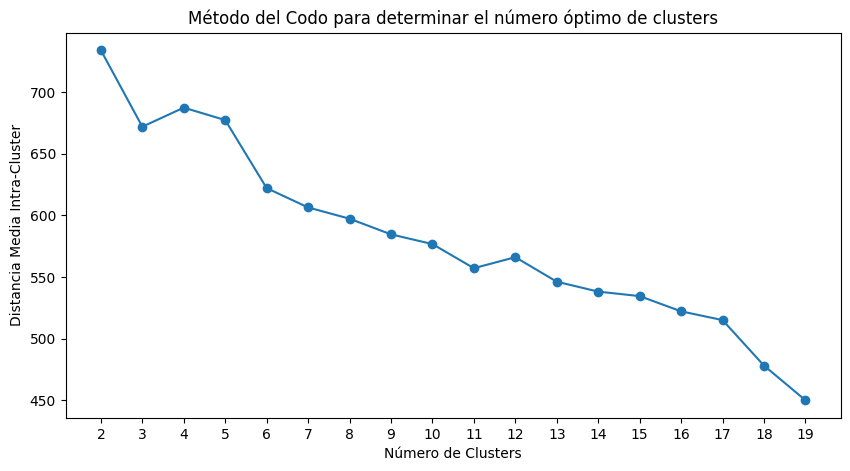

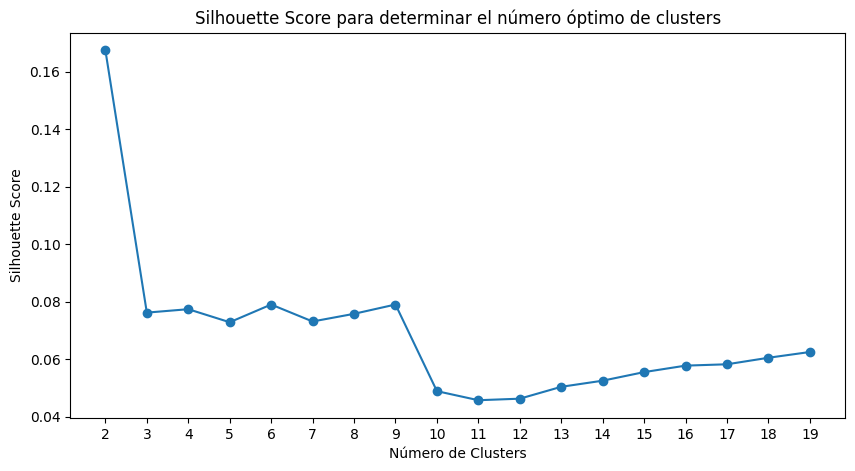

In [41]:
mean_distances = []
silhouette_scores = []
range_n_clusters = range(2, 20)

for n_clusters in range_n_clusters:
    clustering = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
    labels = clustering.fit_predict(all_stations_df_10y_imputed.T)
    cluster_distances = []
    for i in range(n_clusters):
        cluster_points = all_stations_df_10y_imputed.T[labels == i]
        if len(cluster_points) > 1:
            distances = cdist(cluster_points, cluster_points, 'euclidean')
            cluster_distances.append(np.mean(distances))
    mean_distances.append(np.mean(cluster_distances))
    silhouette_avg = silhouette_score(all_stations_df_10y_imputed.T, labels)
    silhouette_scores.append(silhouette_avg)

plt.figure(figsize=(10, 5))
plt.plot(range_n_clusters, mean_distances, marker='o')
plt.title('Método del Codo para determinar el número óptimo de clusters')
plt.xticks(range_n_clusters)
plt.xlabel('Número de Clusters')
plt.ylabel('Distancia Media Intra-Cluster')
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.title('Silhouette Score para determinar el número óptimo de clusters')
plt.xticks(range_n_clusters)
plt.xlabel('Número de Clusters')
plt.ylabel('Silhouette Score')
plt.show()

### Gap Statistic y Davies-Bouldin Index

In [42]:
from sklearn.cluster import KMeans
import numpy as np


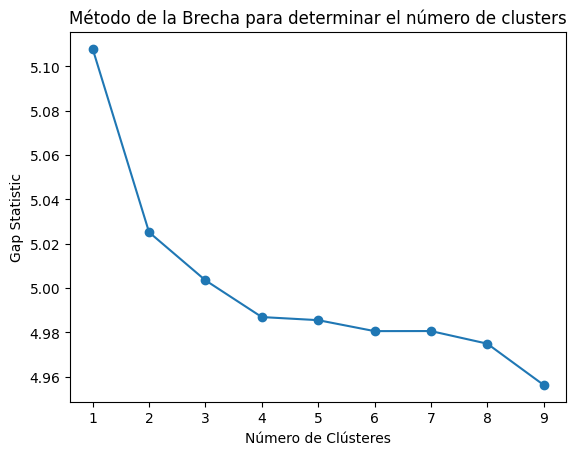

In [43]:
def gap_statistic(X, n_refs=10, max_clusters=15):
    import numpy as np
    from sklearn.cluster import KMeans
    
    gaps = np.zeros(max_clusters-1)
    results = np.zeros((max_clusters-1, n_refs))
    
    for k in range(1, max_clusters):
        km = KMeans(n_clusters=k)
        km.fit(X)
        disp = np.mean(np.min(cdist(X, km.cluster_centers_, 'euclidean'), axis=1))
        
        for i in range(n_refs):
            random_ref = np.random.random_sample(size=X.shape)
            km.fit(random_ref)
            ref_disp = np.mean(np.min(cdist(random_ref, km.cluster_centers_, 'euclidean'), axis=1))
            results[k-1, i] = np.log(ref_disp)
        
        gaps[k-1] = np.log(disp) - np.mean(results[k-1, :])
    
    return gaps

gaps = gap_statistic(all_stations_df_10y_imputed.T.values, max_clusters=10)
plt.plot(range(1, 10), gaps, marker='o')
plt.xlabel('Número de Clústeres')
plt.ylabel('Gap Statistic')
plt.title('Método de la Brecha para determinar el número de clusters')
plt.show()

In [44]:
from sklearn.metrics import davies_bouldin_score

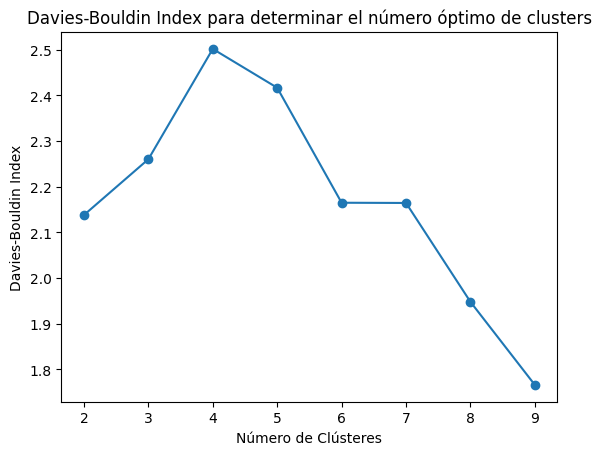

In [45]:
davies_bouldin = []
for k in range(2, 10):
    clustering = AgglomerativeClustering(n_clusters=k)
    labels = clustering.fit_predict(all_stations_df_10y_imputed.T)
    score = davies_bouldin_score(all_stations_df_10y_imputed.T, labels)
    davies_bouldin.append(score)

plt.plot(range(2, 10), davies_bouldin, marker='o')
plt.xlabel('Número de Clústeres')
plt.ylabel('Davies-Bouldin Index')
plt.title('Davies-Bouldin Index para determinar el número óptimo de clusters')
plt.show()

### Validación cruzada con estabilidad de los clústeres

In [46]:
from sklearn.utils import resample

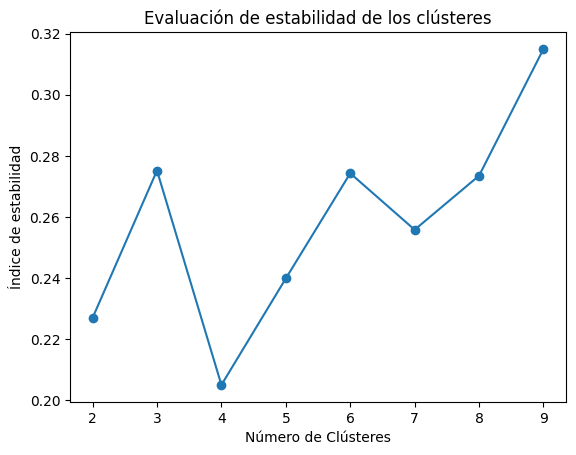

In [47]:

def stability_index(X, max_clusters=10, n_bootstrap=10):
    stability_scores = []
    
    for k in range(2, max_clusters):
        labels_sets = []
        scores = []
        
        for _ in range(n_bootstrap):
            # Realiza el remuestreo con el 90% de los datos
            X_sample = resample(X, replace=True, n_samples=int(0.9 * X.shape[0]), random_state=42)
            
            # Aplica clustering
            clustering = AgglomerativeClustering(n_clusters=k)
            labels = clustering.fit_predict(X_sample)
            
            # Guarda las etiquetas para análisis
            labels_sets.append((X_sample, labels))
        
        # Calcula silhouette_score solo sobre el subconjunto de datos correspondiente
        for X_sub, labels in labels_sets:
            if len(np.unique(labels)) > 1:  # silhouette_score requiere al menos 2 clústeres
                score = silhouette_score(X_sub, labels)
                scores.append(score)
        
        # Guarda el promedio de silhouette_score
        stability_scores.append(np.mean(scores) if scores else np.nan)  

    return stability_scores

stability_scores = stability_index(all_stations_df_10y_imputed.T.values)
plt.plot(range(2, 10), stability_scores, marker='o')
plt.xlabel('Número de Clústeres')
plt.ylabel('Índice de estabilidad')
plt.title('Evaluación de estabilidad de los clústeres')
plt.show()


### Mapa de cluster

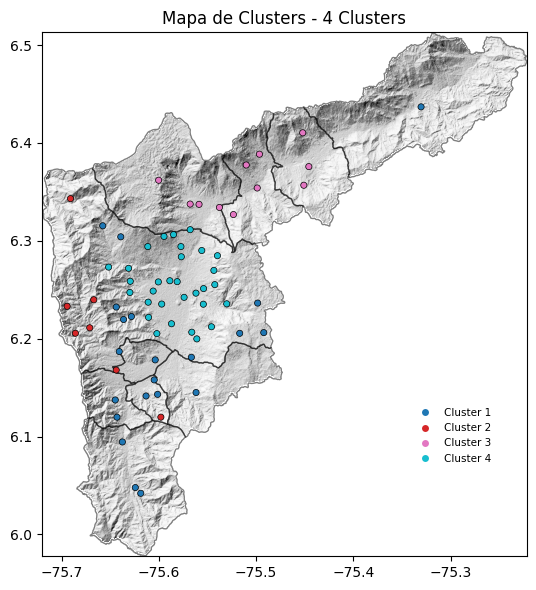

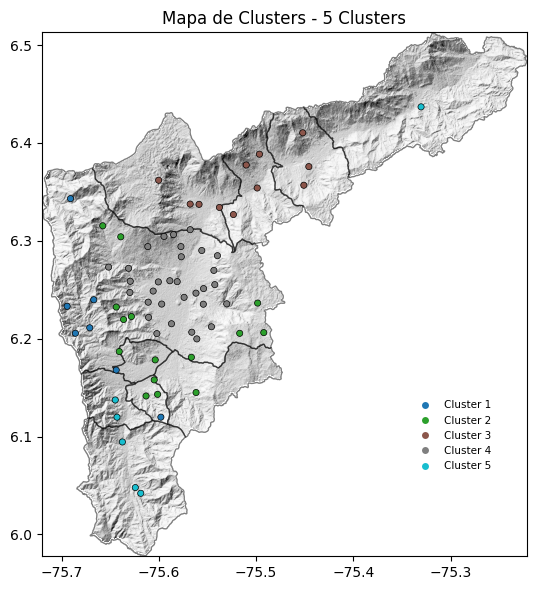

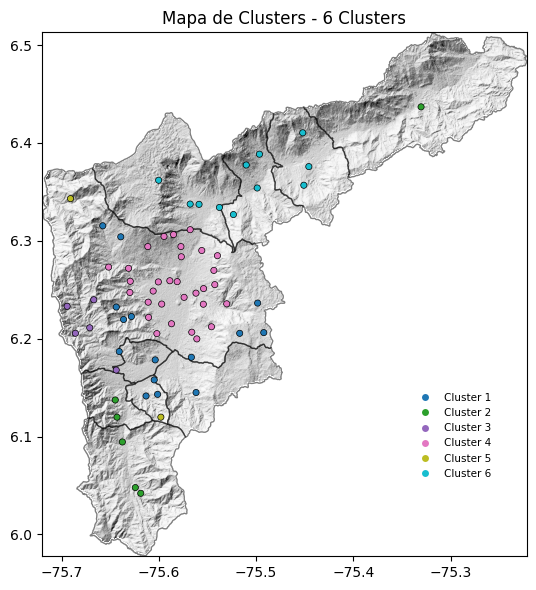

In [48]:
# 📌 Asegurar que los identificadores de estaciones coincidan con los datos
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']
all_stations_df_10y_imputed.columns = (
    all_stations_df_10y_imputed.columns
    .str.replace("Est_", "")
    .astype(int)
)

# 📌 Función para graficar el mapa de clusters
def plot_cluster_map(n_clusters):
    """
    Genera y grafica un mapa con la clasificación de estaciones en clusters.

    Parámetros:
    - n_clusters (int): Número de clusters a calcular.
    """
    # 📌 Aplicar Agglomerative Clustering
    hc = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
    labels_hc = hc.fit_predict(all_stations_df_10y_imputed.T)

    # 📌 Asignar colores a los clusters
    colores_base = plt.rcParams['axes.prop_cycle'].by_key()['color']
    colores = colores_base * (n_clusters // len(colores_base)) + colores_base[:n_clusters % len(colores_base)]

    # 📌 Crear nueva columna con los clusters en el GeoDataFrame
    for i in np.unique(labels_hc):
        cluster = all_stations_df_10y_imputed.columns[labels_hc == i]
        pluvios_shp_c.loc[cluster, 'color'] = colores[i]
        pluvios_shp_c.loc[cluster, 'cluster_name'] = f'Cluster {i+1}'

    # 📌 Generar el mapa
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)
    pluvios_shp_c.plot(ax=ax, c=pluvios_shp_c['color'], edgecolor='k', markersize=20, linewidth=0.5,
                       column="cluster_name",
                       categorical=True,
                       legend=True,
                       legend_kwds={"loc": "center left", "bbox_to_anchor": (0.75, 0.23), "fontsize": 7.5,
                                    "markerscale": 0.5, "frameon": False})
    plt.title(f"Mapa de Clusters - {n_clusters} Clusters", fontsize=12)
    plt.tight_layout()
    plt.show()


# 📌 Generar mapas para 4, 5 y 6 clusters
for n in [4, 5, 6]:
    plot_cluster_map(n)

## **CON MATRIZ DE VECINDAD**

In [10]:
import scipy.sparse as sp
from scipy.spatial import Delaunay
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph, radius_neighbors_graph
from rasterio.plot import show
from pyproj import Transformer

In [11]:
# Cargar coordenadas
coords_df = pd.read_csv("../../DATA/coords_SIATA.csv", index_col="Codigo")
# 📌 Convertir coordenadas geográficas a UTM
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3116", always_xy=True)
coords_df['X'], coords_df['Y'] = zip(*coords_df.apply(lambda row: transformer.transform(row['Longitude'], row['Latitude']), axis=1))


# 📌 Asegurar que los identificadores de estaciones coincidan con los datos
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']
all_stations_df_10y_imputed.columns = (
    all_stations_df_10y_imputed.columns
    .str.replace("Est_", "")
    .astype(int)
)

# Validar que los índices coincidan entre las coordenadas y las series de tiempo
all_stations_df_10y_imputed.columns = all_stations_df_10y_imputed.columns.astype(int)
coords_df = coords_df.loc[all_stations_df_10y_imputed.columns]

# 📌 Filtrar el GeoDataFrame para que solo contenga las estaciones analizadas
pluvios_shp_c = pluvios_shp_c.loc[all_stations_df_10y_imputed.columns]

In [12]:
# 📌 Función para construir la matriz de conectividad
def build_connectivity_matrix(method, param):
    """
    Construye la matriz de conectividad para el clustering.

    Parámetros:
    - method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Número de vecinos para k-NN o radio en metros.

    Retorna:
    - Matriz de conectividad.
    """
    if method == 'kneighbors':
        return kneighbors_graph(coords_df[['X', 'Y']], n_neighbors=int(param), include_self=False)
    elif method == 'radius':
        return radius_neighbors_graph(coords_df[['X', 'Y']], radius=float(param), include_self=False)
    elif method == 'delaunay':
        tri = Delaunay(coords_df[['X', 'Y']].values)
        n_points = len(coords_df)
        connectivity_matrix = sp.lil_matrix((n_points, n_points))
        for simplex in tri.simplices:
            for i in range(3):
                for j in range(i + 1, 3):
                    connectivity_matrix[simplex[i], simplex[j]] = 1
                    connectivity_matrix[simplex[j], simplex[i]] = 1
        return connectivity_matrix.tocsr()
    else:
        raise ValueError("Método no reconocido. Usa 'kneighbors', 'radius' o 'delaunay'.")

# 📌 Función para graficar el mapa de clusters
def plot_cluster_map(n_clusters, connectivity_method='kneighbors', param=5):
    """
    Genera y grafica un mapa con la clasificación de estaciones en clusters.

    Parámetros:
    - n_clusters (int): Número de clusters a calcular.
    - connectivity_method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Parámetro de conectividad (número de vecinos o radio en metros).
    """
    # 📌 Construir matriz de conectividad
    connectivity = build_connectivity_matrix(connectivity_method, param)

    # 📌 Aplicar Agglomerative Clustering
    hc = AgglomerativeClustering(n_clusters=n_clusters, connectivity=connectivity, linkage='ward')
    labels_hc = hc.fit_predict(all_stations_df_10y_imputed.T)

    # 📌 Asignar clusters al GeoDataFrame
    pluvios_shp_c['cluster'] = labels_hc

    # 📌 Asignar colores a los clusters
    colores_base = plt.rcParams['axes.prop_cycle'].by_key()['color']
    colores = colores_base * (n_clusters // len(colores_base)) + colores_base[:n_clusters % len(colores_base)]
    for i in np.unique(labels_hc):
        pluvios_shp_c.loc[pluvios_shp_c['cluster'] == i, 'color'] = colores[i]

    # 📌 Generar el mapa
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)
    pluvios_shp_c.plot(ax=ax, c=pluvios_shp_c['color'], edgecolor='k', markersize=20, linewidth=0.5,
                       column="cluster",
                       categorical=True,
                       legend=True,
                       legend_kwds={"loc": "center left", "bbox_to_anchor": (0.75, 0.23), "fontsize": 7.5,
                                    "markerscale": 0.5, "frameon": False})
    
    plt.title(f"Mapa de Clusters ({connectivity_method} - {param})", fontsize=12)
    plt.tight_layout()
    plt.show()

Haciendo mapas con método de conectividad: kneighbors y parámetro 5
Generando mapa con 4 clusters


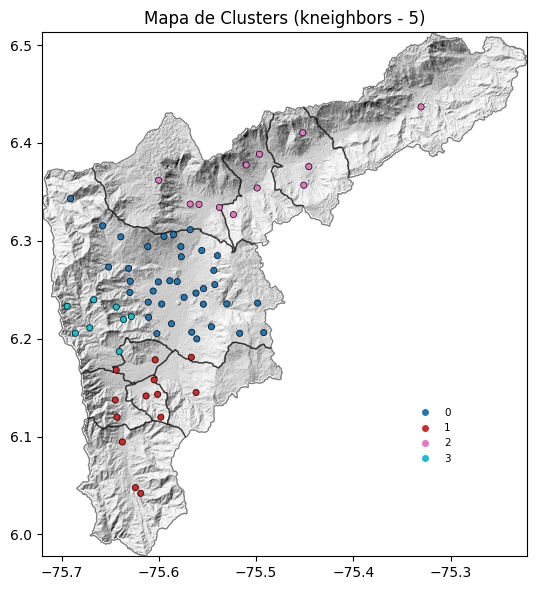

Generando mapa con 5 clusters


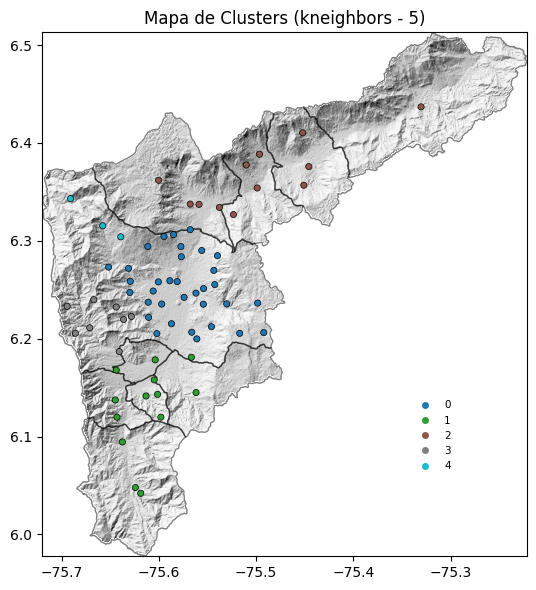

Generando mapa con 6 clusters


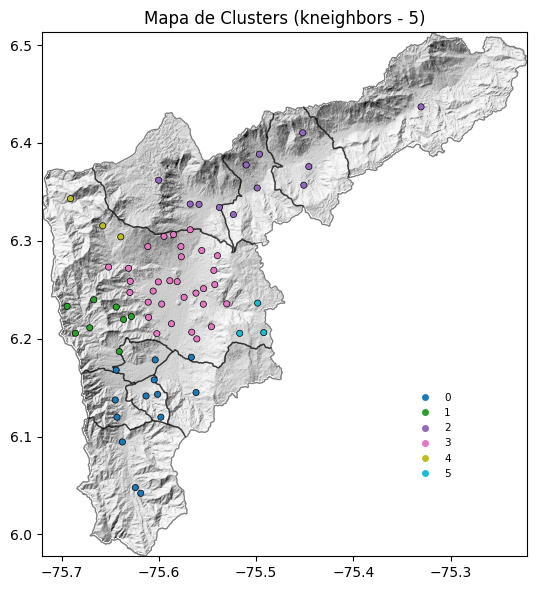

Haciendo mapas con método de conectividad: radius y parámetro 5000
Generando mapa con 4 clusters


/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:325: UserWarning: the number of connected components of the connectivity matrix is 4 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


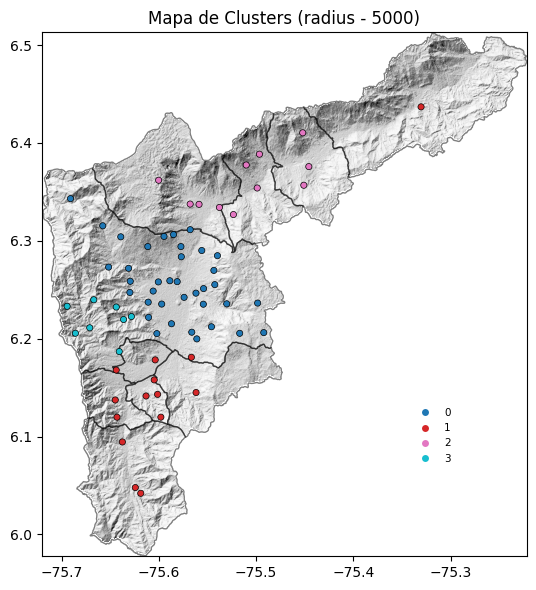

Generando mapa con 5 clusters


/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:325: UserWarning: the number of connected components of the connectivity matrix is 4 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


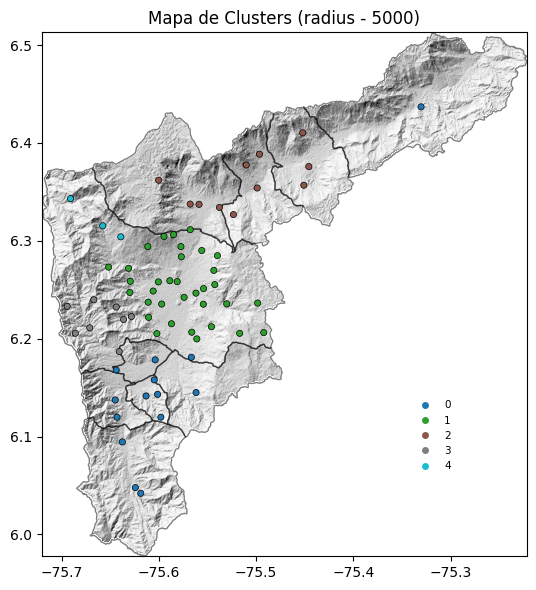

Generando mapa con 6 clusters


/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:325: UserWarning: the number of connected components of the connectivity matrix is 4 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


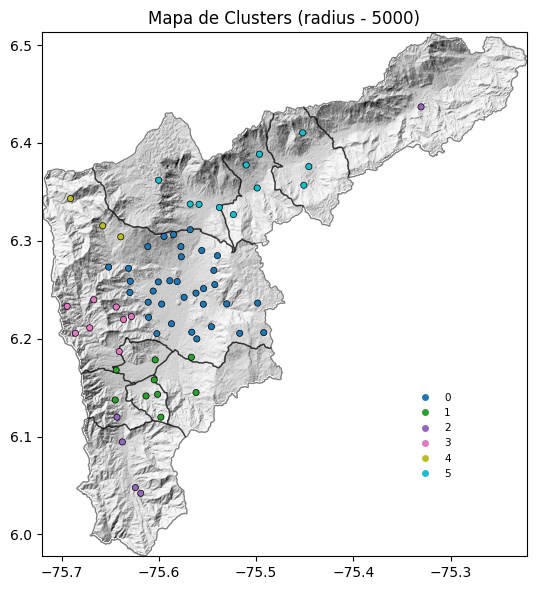

Haciendo mapas con método de conectividad: delaunay y parámetro None
Generando mapa con 4 clusters


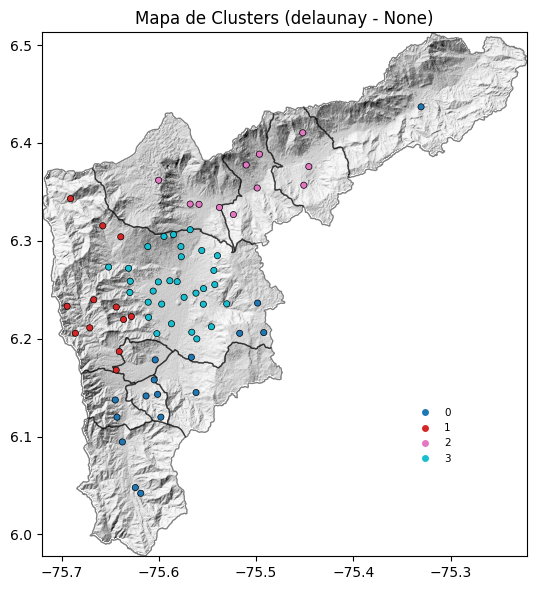

Generando mapa con 5 clusters


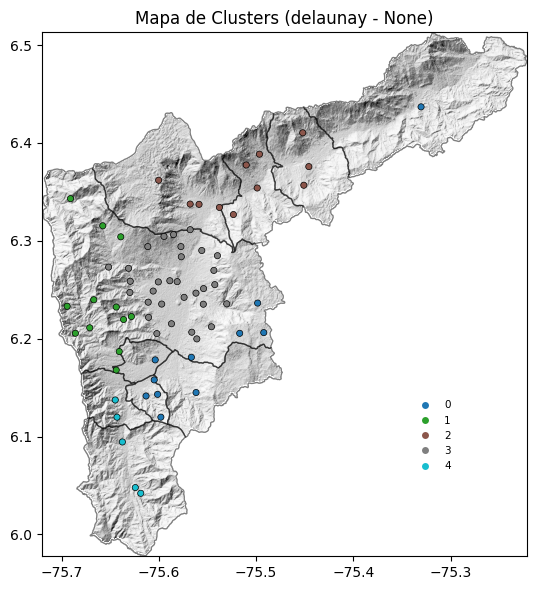

Generando mapa con 6 clusters


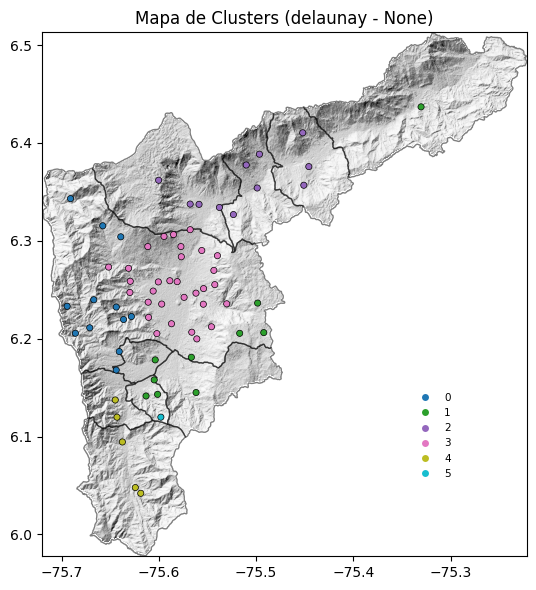

In [13]:
# 📌 Generar mapas para 4, 5 y 6 clusters con distintas matrices de conectividad
for method, param in [('kneighbors', 5), ('radius', 5000), ('delaunay', None)]:
    print(f'Haciendo mapas con método de conectividad: {method} y parámetro {param}')
    for n in [4, 5, 6]:
        print(f"Generando mapa con {n} clusters")
        plot_cluster_map(n_clusters=n, connectivity_method=method, param=param)

## **EPM: Diario**

In [13]:
# 1. Obtén la lista de archivos diarios
# 1. Obtén la lista de archivos diarios
daily_files = sorted(glob(daily_output + 'Daily_Est_*.csv'))

# 2. Extrae el número de estación desde el nombre de archivo
stations_with_paths = [
    (int(os.path.basename(file).split('_')[-1].split('.')[0]), file) 
    for file in daily_files
]

# 3. Ordena la lista por número de estación
stations_with_paths_sorted = sorted(stations_with_paths, key=lambda x: x[0])

# 4. Filtra las estaciones de SIATA (excluyendo las últimas 16, que asumes son EPM)
siata_stations_with_paths = stations_with_paths_sorted[-16:]

# 5. Carga y renombra los datos de cada estación
data_frames = []
station_numbers = []

for station_number, file in siata_stations_with_paths:
    # Lee el archivo CSV usando 'Fecha' como índice de tipo datetime
    station_data = pd.read_csv(file, index_col='Fecha', parse_dates=True)

    # Intenta renombrar la columna de precipitación como 'Est_{station_number}'
    if 'P' in station_data.columns:
        station_data.rename(columns={'P': f'Est_{station_number}'}, inplace=True)
    else:
        # Si no existe la columna 'P', busca alguna columna que contenga 'P' en su nombre
        precip_column = [col for col in station_data.columns if 'P' in col.upper()]
        if precip_column:
            station_data.rename(
                columns={precip_column[0]: f'Est_{station_number}'}, 
                inplace=True
            )
        else:
            print(f"Advertencia: No se encontró columna de precipitación en {file}")
            continue

    data_frames.append(station_data)
    station_numbers.append(station_number)

# 6. Concatena todos los DataFrames, uniendo por índice (outer join)
all_stations_df = pd.concat(data_frames, axis=1, join='outer')

In [14]:
# Dejar estaciones con 10 o más años de datos
min_hours = 10 * 365  # ~87,600

# Filtra columnas (estaciones) que tengan al menos 'min_hours' datos válidos (no nulos)
all_stations_df_10y = all_stations_df.loc[:, all_stations_df.count() >= min_hours]

# Filtrar filas desde '2013-01-01' hasta el final de las series
all_stations_df_10y = all_stations_df_10y.loc['1990-01-01':]

# Mostrar la cantidad de datos faltantes por estación
missing_values = all_stations_df_10y.isna().sum()
total_days = len(all_stations_df_10y)
missing_percentage = (missing_values / total_days) * 100


print("Porcentaje de datos faltantes (NaN) por estación:")
# 1. Creamos el DataFrame con ambas series
df_missing = pd.DataFrame({
    'Datos_faltantes': missing_values,
    'Porcentaje_NaN': missing_percentage
})

# 2. Redondear el porcentaje a 2 decimales
df_missing['Porcentaje_NaN'] = df_missing['Porcentaje_NaN'].round(2)

# 3. Mostrar el resultado
print(df_missing)

Porcentaje de datos faltantes (NaN) por estación:
             Datos_faltantes  Porcentaje_NaN
Est_2308023               78            0.65
Est_2701035               95            0.79
Est_2701036               54            0.45
Est_2701038               42            0.35
Est_2701045               48            0.40
Est_2701046               45            0.38
Est_2701056               43            0.36
Est_2701057               42            0.35
Est_2701093               43            0.36
Est_2701114              772            6.44
Est_2701115              374            3.12
Est_2701122             1868           15.58
Est_2701481             2264           18.88
Est_2701485             2283           19.04
Est_2701517               98            0.82
Est_2701950               59            0.49


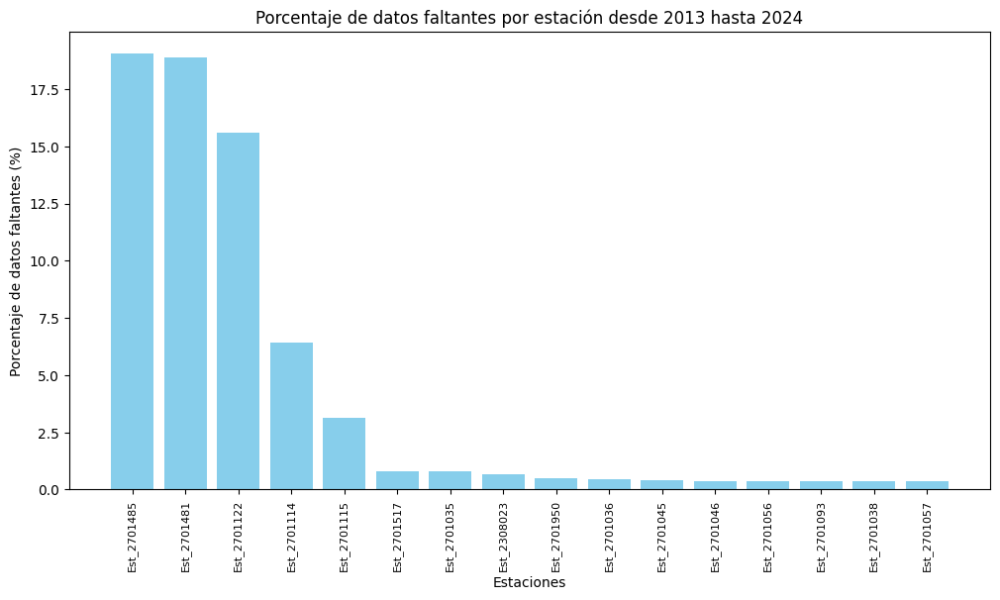

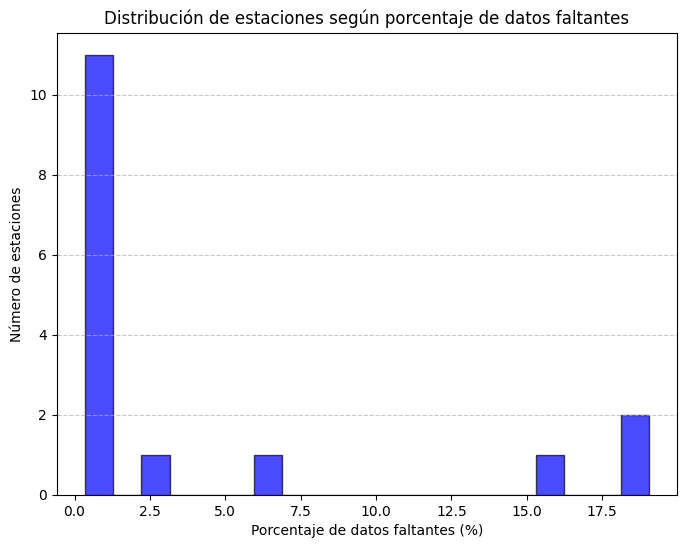

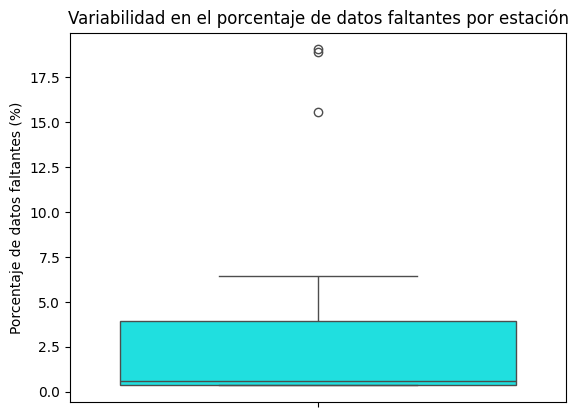

In [15]:
# Hacer un gráfico de barras con los datos faltantes
df_missing_sorted = df_missing.sort_values(by='Porcentaje_NaN', ascending=False)

plt.figure(figsize=(12, 6))
plt.bar(df_missing_sorted.index, df_missing_sorted['Porcentaje_NaN'], color='skyblue')
plt.xticks(rotation=90, fontsize=8)
plt.ylabel("Porcentaje de datos faltantes (%)")
plt.xlabel("Estaciones")
plt.title("Porcentaje de datos faltantes por estación desde 2013 hasta 2024")
plt.show()


# Hacer un histograma de los porcentajes de datos faltantes

plt.figure(figsize=(8, 6))
plt.hist(df_missing['Porcentaje_NaN'], bins=20, color='blue', edgecolor='black', alpha=0.7)
plt.xlabel("Porcentaje de datos faltantes (%)")
plt.ylabel("Número de estaciones")
plt.title("Distribución de estaciones según porcentaje de datos faltantes")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# Hacer un boxplot de los porcentajes de datos faltantes
sns.boxplot(y=df_missing['Porcentaje_NaN'], color="cyan")
plt.ylabel("Porcentaje de datos faltantes (%)")
plt.title("Variabilidad en el porcentaje de datos faltantes por estación")
plt.show()

In [16]:
def imputar_nan_diario(df):
    """
    Rellena los valores NaN en un DataFrame de series temporales diarias.
    
    1. Interpola valores ausentes de hasta un límite de días consecutivos (por ejemplo, 7).
    2. Rellena los NaN restantes con la media de cada día del año (dayofyear).

    Args:
        df (pd.DataFrame): 
            DataFrame con índice de tipo fecha (diario) y 
            columnas correspondientes a distintas series (por ejemplo, estaciones).
    
    Returns:
        pd.DataFrame: DataFrame con los NaN imputados.
    """
    df_imputado = df.copy()
    
    # Paso 1: Interpola huecos de hasta 'limit' días consecutivos
    # (Puedes ajustar limit según tus necesidades: 7, 5, 3, etc.)
    df_imputado = df_imputado.interpolate(method='time', limit=2, limit_direction='both')
    
    # Paso 2: Rellenar lo que quede con la media de cada día del año
    # Creamos una columna auxiliar con el día del año
    df_imputado['DiaDelAnio'] = df_imputado.index.dayofyear
    
    # Calculamos la media para cada día del año; transform('mean') aplica 
    # la operación columna por columna dentro de cada grupo.
    medias_por_dia = df_imputado.groupby('DiaDelAnio').transform('mean')
    
    # Rellenamos los NaN con esos valores medios
    df_imputado = df_imputado.fillna(medias_por_dia)
    
    # Eliminamos la columna auxiliar
    df_imputado.drop(columns=['DiaDelAnio'], inplace=True)
    
    return df_imputado

In [17]:
all_stations_df_10y_imputed = imputar_nan_diario(all_stations_df_10y)


missing_values_2 = all_stations_df_10y_imputed.isna().sum()
total_days = len(all_stations_df_10y_imputed)
missing_percentage = (missing_values_2 / total_days) * 100


print("Porcentaje de datos faltantes (NaN) por estación:")
# 1. Creamos el DataFrame con ambas series
df_missing = pd.DataFrame({
    'Datos_faltantes': missing_values_2,
    'Porcentaje_NaN': missing_percentage
})

# 2. Redondear el porcentaje a 2 decimales
df_missing['Porcentaje_NaN'] = df_missing['Porcentaje_NaN'].round(2)

# 3. Mostrar el resultado
print(df_missing)

Porcentaje de datos faltantes (NaN) por estación:
             Datos_faltantes  Porcentaje_NaN
Est_2308023                0             0.0
Est_2701035                0             0.0
Est_2701036                0             0.0
Est_2701038                0             0.0
Est_2701045                0             0.0
Est_2701046                0             0.0
Est_2701056                0             0.0
Est_2701057                0             0.0
Est_2701093                0             0.0
Est_2701114                0             0.0
Est_2701115                0             0.0
Est_2701122                0             0.0
Est_2701481                0             0.0
Est_2701485                0             0.0
Est_2701517                0             0.0
Est_2701950                0             0.0


In [18]:
all_stations_df_10y_imputed

,Est_2308023,Est_2701035,Est_2701036,Est_2701038,Est_2701045,Est_2701046,Est_2701056,Est_2701057,Est_2701093,Est_2701114,Est_2701115,Est_2701122,Est_2701481,Est_2701485,Est_2701517,Est_2701950
Fecha,,,,,,,,,,,,,,,,
1990-01-01,2.232,0.000,17.031,11.253,1.953,5.580,0.000,0.000,1.767,1.726290,1.930781,0.420893,0.567269,1.985385,1.581,1.023
1990-01-02,0.072,0.000,0.537,0.363,0.063,0.180,0.000,0.000,0.057,0.198323,1.100969,0.698214,0.593231,1.026692,0.051,0.033
1990-01-03,0.558,0.000,0.651,0.000,0.000,0.000,0.000,0.000,0.000,1.403871,3.034969,2.505571,1.262962,2.176269,0.000,0.186
1990-01-04,0.018,0.000,8.391,1.674,0.000,0.651,0.000,1.953,0.000,0.996677,2.652406,2.778929,1.847346,2.377846,0.000,0.006
1990-01-05,0.558,2.976,0.828,0.054,0.000,2.253,0.000,0.063,0.000,3.202484,3.789469,4.229107,1.010885,2.167615,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-25,0.000,0.000,0.000,0.000,0.170,0.170,0.255,0.085,3.217,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000
2022-10-26,0.000,0.678,0.000,1.865,0.848,8.214,1.695,6.438,1.272,2.541000,0.000000,0.763000,1.949000,0.255000,1.018,0.000
2022-10-27,0.000,5.842,0.000,3.136,1.187,2.116,3.432,3.475,0.085,1.526000,0.000000,2.035000,2.371000,0.679000,1.273,0.000


### Hierarchical clustering

Text(0, 0.5, 'Distancia')

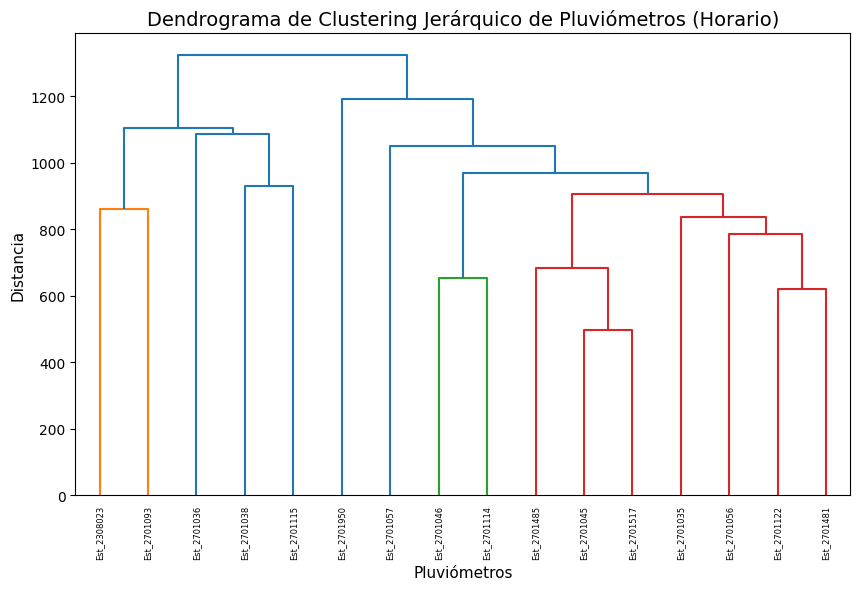

In [12]:
Z = sch.linkage(all_stations_df_10y_imputed.T, method='ward', metric='euclidean')

plt.figure(figsize=(10, 6))

dendrogram = sch.dendrogram(
    Z,
    labels=all_stations_df_10y_imputed.columns,
    leaf_rotation=90, 
    leaf_font_size=6
)

plt.title("Dendrograma de Clustering Jerárquico de Pluviómetros (Horario)", fontsize=14)
plt.xlabel("Pluviómetros", fontsize=11)
plt.ylabel("Distancia", fontsize=11)

### Número óptimo de clusters: Método del codo y Silhouette Score

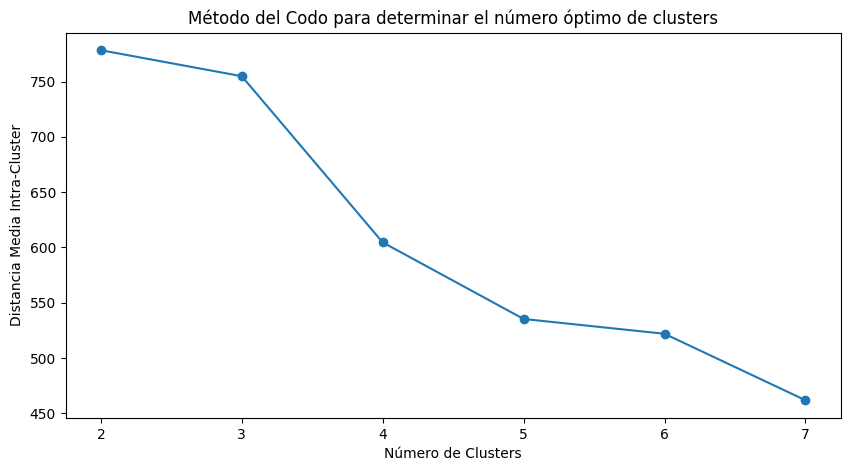

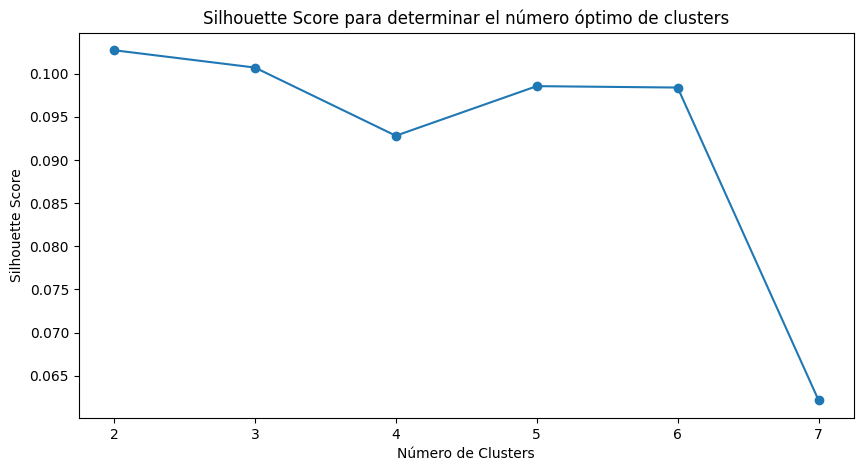

In [15]:
mean_distances = []
silhouette_scores = []
range_n_clusters = range(2, 8)

for n_clusters in range_n_clusters:
    clustering = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
    labels = clustering.fit_predict(all_stations_df_10y_imputed.T)
    cluster_distances = []
    for i in range(n_clusters):
        cluster_points = all_stations_df_10y_imputed.T[labels == i]
        if len(cluster_points) > 1:
            distances = cdist(cluster_points, cluster_points, 'euclidean')
            cluster_distances.append(np.mean(distances))
    mean_distances.append(np.mean(cluster_distances))
    silhouette_avg = silhouette_score(all_stations_df_10y_imputed.T, labels)
    silhouette_scores.append(silhouette_avg)

plt.figure(figsize=(10, 5))
plt.plot(range_n_clusters, mean_distances, marker='o')
plt.title('Método del Codo para determinar el número óptimo de clusters')
plt.xticks(range_n_clusters)
plt.xlabel('Número de Clusters')
plt.ylabel('Distancia Media Intra-Cluster')
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.title('Silhouette Score para determinar el número óptimo de clusters')
plt.xticks(range_n_clusters)
plt.xlabel('Número de Clusters')
plt.ylabel('Silhouette Score')
plt.show()


### Gap Statistic y Davies-Bouldin Index

In [16]:
from sklearn.cluster import KMeans
import numpy as np

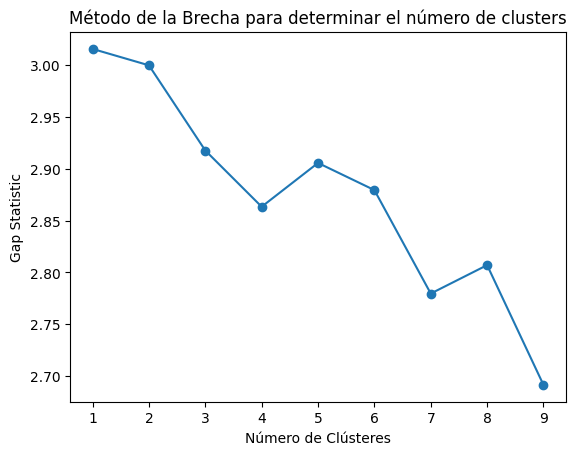

In [17]:
def gap_statistic(X, n_refs=10, max_clusters=15):
    import numpy as np
    from sklearn.cluster import KMeans
    
    gaps = np.zeros(max_clusters-1)
    results = np.zeros((max_clusters-1, n_refs))
    
    for k in range(1, max_clusters):
        km = KMeans(n_clusters=k)
        km.fit(X)
        disp = np.mean(np.min(cdist(X, km.cluster_centers_, 'euclidean'), axis=1))
        
        for i in range(n_refs):
            random_ref = np.random.random_sample(size=X.shape)
            km.fit(random_ref)
            ref_disp = np.mean(np.min(cdist(random_ref, km.cluster_centers_, 'euclidean'), axis=1))
            results[k-1, i] = np.log(ref_disp)
        
        gaps[k-1] = np.log(disp) - np.mean(results[k-1, :])
    
    return gaps

gaps = gap_statistic(all_stations_df_10y_imputed.T.values, max_clusters=10)
plt.plot(range(1, 10), gaps, marker='o')
plt.xlabel('Número de Clústeres')
plt.ylabel('Gap Statistic')
plt.title('Método de la Brecha para determinar el número de clusters')
plt.show()

In [18]:
from sklearn.metrics import davies_bouldin_score

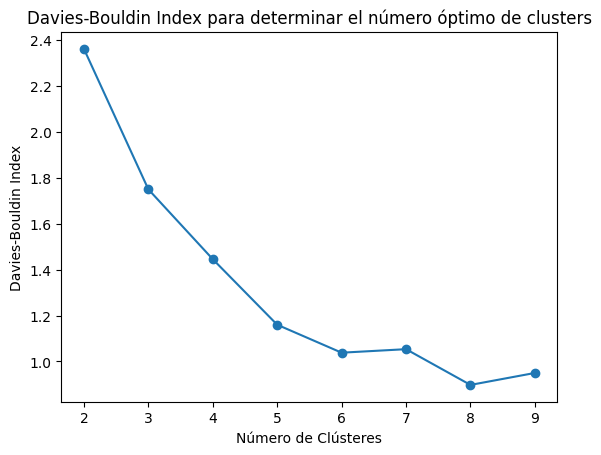

In [19]:
davies_bouldin = []
for k in range(2, 10):
    clustering = AgglomerativeClustering(n_clusters=k)
    labels = clustering.fit_predict(all_stations_df_10y_imputed.T)
    score = davies_bouldin_score(all_stations_df_10y_imputed.T, labels)
    davies_bouldin.append(score)

plt.plot(range(2, 10), davies_bouldin, marker='o')
plt.xlabel('Número de Clústeres')
plt.ylabel('Davies-Bouldin Index')
plt.title('Davies-Bouldin Index para determinar el número óptimo de clusters')
plt.show()

### Validación cruzada con estabilidad de los clústeres

In [20]:
from sklearn.utils import resample

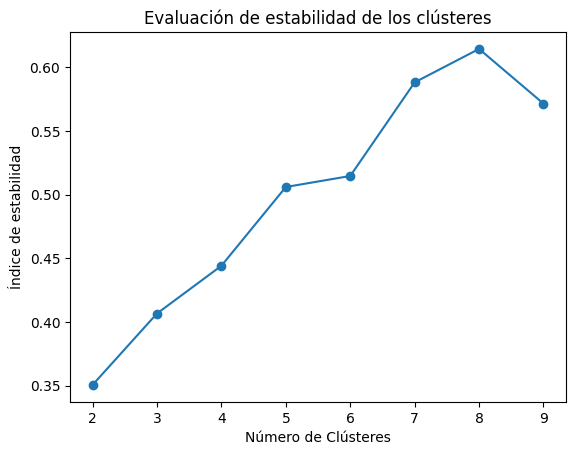

In [21]:
def stability_index(X, max_clusters=10, n_bootstrap=10):
    stability_scores = []
    
    for k in range(2, max_clusters):
        labels_sets = []
        scores = []
        
        for _ in range(n_bootstrap):
            # Realiza el remuestreo con el 90% de los datos
            X_sample = resample(X, replace=True, n_samples=int(0.9 * X.shape[0]), random_state=42)
            
            # Aplica clustering
            clustering = AgglomerativeClustering(n_clusters=k)
            labels = clustering.fit_predict(X_sample)
            
            # Guarda las etiquetas para análisis
            labels_sets.append((X_sample, labels))
        
        # Calcula silhouette_score solo sobre el subconjunto de datos correspondiente
        for X_sub, labels in labels_sets:
            if len(np.unique(labels)) > 1:  # silhouette_score requiere al menos 2 clústeres
                score = silhouette_score(X_sub, labels)
                scores.append(score)
        
        # Guarda el promedio de silhouette_score
        stability_scores.append(np.mean(scores) if scores else np.nan)  

    return stability_scores

stability_scores = stability_index(all_stations_df_10y_imputed.T.values)
plt.plot(range(2, 10), stability_scores, marker='o')
plt.xlabel('Número de Clústeres')
plt.ylabel('Índice de estabilidad')
plt.title('Evaluación de estabilidad de los clústeres')
plt.show()


### Mapa de cluster

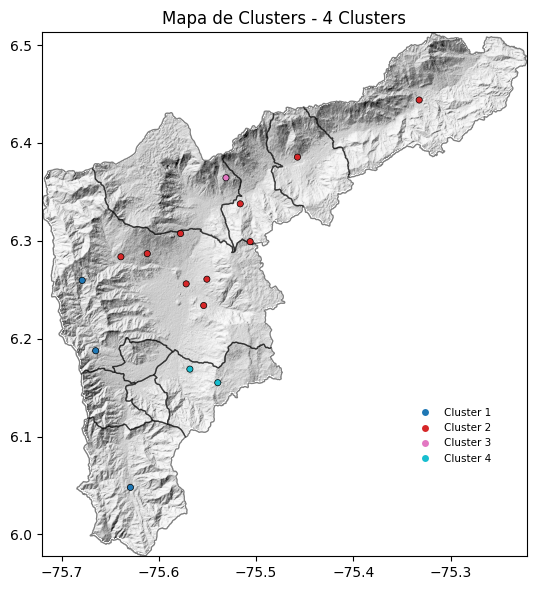

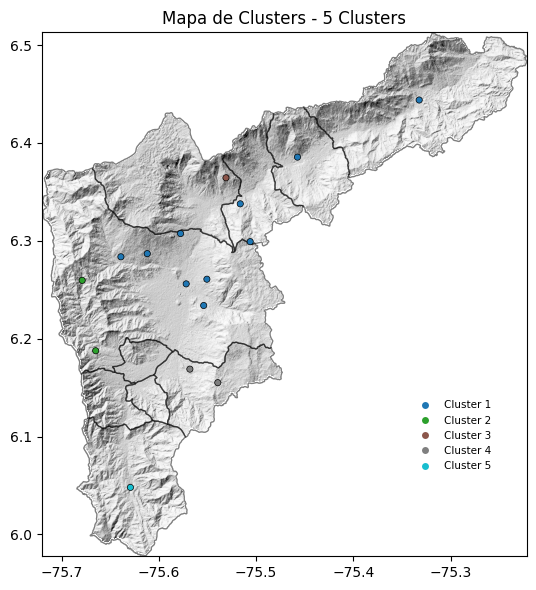

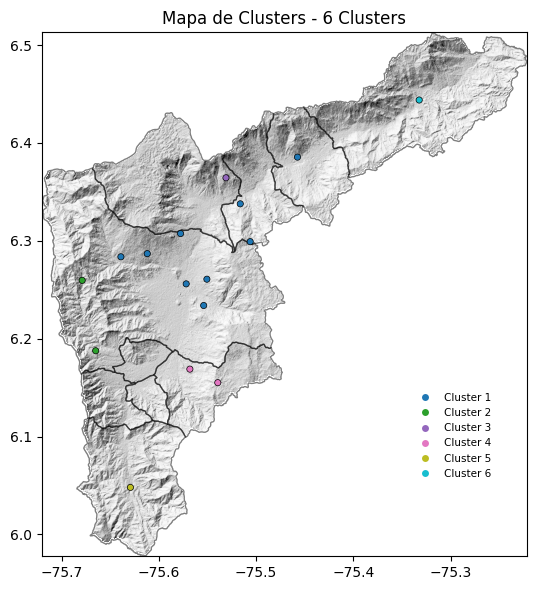

In [9]:


# 📌 Asegurar que los identificadores de estaciones coincidan con los datos
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']
all_stations_df_10y_imputed.columns = (
    all_stations_df_10y_imputed.columns
    .str.replace("Est_", "")
    .astype(int)
)

# 📌 Función para graficar el mapa de clusters
def plot_cluster_map(n_clusters):
    """
    Genera y grafica un mapa con la clasificación de estaciones en clusters.

    Parámetros:
    - n_clusters (int): Número de clusters a calcular.
    """
    # 📌 Aplicar Agglomerative Clustering
    hc = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
    labels_hc = hc.fit_predict(all_stations_df_10y_imputed.T)

    # 📌 Asignar colores a los clusters
    colores_base = plt.rcParams['axes.prop_cycle'].by_key()['color']
    colores = colores_base * (n_clusters // len(colores_base)) + colores_base[:n_clusters % len(colores_base)]

    # 📌 Crear nueva columna con los clusters en el GeoDataFrame
    for i in np.unique(labels_hc):
        cluster = all_stations_df_10y_imputed.columns[labels_hc == i]
        pluvios_shp_c.loc[cluster, 'color'] = colores[i]
        pluvios_shp_c.loc[cluster, 'cluster_name'] = f'Cluster {i+1}'

    # 📌 Generar el mapa
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)
    pluvios_shp_c.plot(ax=ax, c=pluvios_shp_c['color'], edgecolor='k', markersize=20, linewidth=0.5,
                       column="cluster_name",
                       categorical=True,
                       legend=True,
                       legend_kwds={"loc": "center left", "bbox_to_anchor": (0.75, 0.23), "fontsize": 7.5,
                                    "markerscale": 0.5, "frameon": False})
    plt.title(f"Mapa de Clusters - {n_clusters} Clusters", fontsize=12)
    plt.tight_layout()
    plt.show()


# 📌 Generar mapas para 4, 5 y 6 clusters
for n in [4, 5, 6]:
    plot_cluster_map(n)

## **CON MATRIZ DE VECINDAD**

In [19]:
import scipy.sparse as sp
from scipy.spatial import Delaunay
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph, radius_neighbors_graph
from rasterio.plot import show
from pyproj import Transformer

In [21]:
# Cargar coordenadas
coords_df = pd.read_csv("../../DATA/coords_EPM.csv", index_col="idestacion")
# 📌 Convertir coordenadas geográficas a UTM
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3116", always_xy=True)
coords_df['X'], coords_df['Y'] = zip(*coords_df.apply(lambda row: transformer.transform(row['longitud'], row['latitud']), axis=1))


# 📌 Asegurar que los identificadores de estaciones coincidan con los datos
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']
all_stations_df_10y_imputed.columns = (
    all_stations_df_10y_imputed.columns
    .str.replace("Est_", "")
    .astype(int)
)

# Validar que los índices coincidan entre las coordenadas y las series de tiempo
all_stations_df_10y_imputed.columns = all_stations_df_10y_imputed.columns.astype(int)
coords_df = coords_df.loc[all_stations_df_10y_imputed.columns]

# 📌 Filtrar el GeoDataFrame para que solo contenga las estaciones analizadas
pluvios_shp_c = pluvios_shp_c.loc[all_stations_df_10y_imputed.columns]

In [22]:
# 📌 Función para construir la matriz de conectividad
def build_connectivity_matrix(method, param):
    """
    Construye la matriz de conectividad para el clustering.

    Parámetros:
    - method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Número de vecinos para k-NN o radio en metros.

    Retorna:
    - Matriz de conectividad.
    """
    if method == 'kneighbors':
        return kneighbors_graph(coords_df[['X', 'Y']], n_neighbors=int(param), include_self=False)
    elif method == 'radius':
        return radius_neighbors_graph(coords_df[['X', 'Y']], radius=float(param), include_self=False)
    elif method == 'delaunay':
        tri = Delaunay(coords_df[['X', 'Y']].values)
        n_points = len(coords_df)
        connectivity_matrix = sp.lil_matrix((n_points, n_points))
        for simplex in tri.simplices:
            for i in range(3):
                for j in range(i + 1, 3):
                    connectivity_matrix[simplex[i], simplex[j]] = 1
                    connectivity_matrix[simplex[j], simplex[i]] = 1
        return connectivity_matrix.tocsr()
    else:
        raise ValueError("Método no reconocido. Usa 'kneighbors', 'radius' o 'delaunay'.")

# 📌 Función para graficar el mapa de clusters
def plot_cluster_map(n_clusters, connectivity_method='kneighbors', param=5):
    """
    Genera y grafica un mapa con la clasificación de estaciones en clusters.

    Parámetros:
    - n_clusters (int): Número de clusters a calcular.
    - connectivity_method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Parámetro de conectividad (número de vecinos o radio en metros).
    """
    # 📌 Construir matriz de conectividad
    connectivity = build_connectivity_matrix(connectivity_method, param)

    # 📌 Aplicar Agglomerative Clustering
    hc = AgglomerativeClustering(n_clusters=n_clusters, connectivity=connectivity, linkage='ward')
    labels_hc = hc.fit_predict(all_stations_df_10y_imputed.T)

    # 📌 Asignar clusters al GeoDataFrame
    pluvios_shp_c['cluster'] = labels_hc

    # 📌 Asignar colores a los clusters
    colores_base = plt.rcParams['axes.prop_cycle'].by_key()['color']
    colores = colores_base * (n_clusters // len(colores_base)) + colores_base[:n_clusters % len(colores_base)]
    for i in np.unique(labels_hc):
        pluvios_shp_c.loc[pluvios_shp_c['cluster'] == i, 'color'] = colores[i]

    # 📌 Generar el mapa
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)
    pluvios_shp_c.plot(ax=ax, c=pluvios_shp_c['color'], edgecolor='k', markersize=20, linewidth=0.5,
                       column="cluster",
                       categorical=True,
                       legend=True,
                       legend_kwds={"loc": "center left", "bbox_to_anchor": (0.75, 0.23), "fontsize": 7.5,
                                    "markerscale": 0.5, "frameon": False})
    
    plt.title(f"Mapa de Clusters ({connectivity_method} - {param})", fontsize=12)
    plt.tight_layout()
    plt.show()

Haciendo mapas con método de conectividad: kneighbors y parámetro 5
Generando mapa con 4 clusters


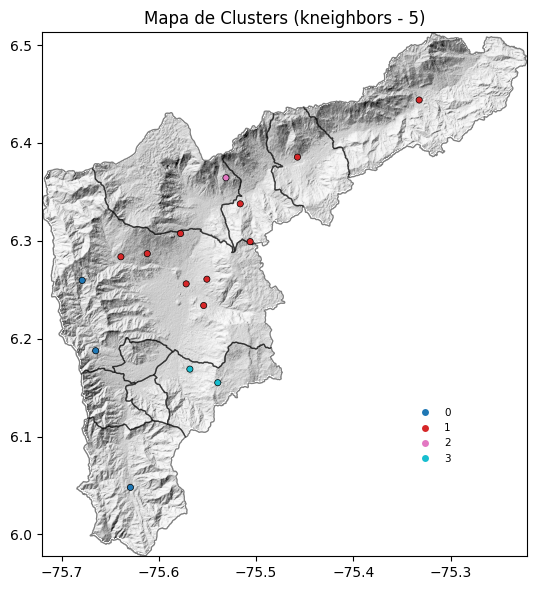

Generando mapa con 5 clusters


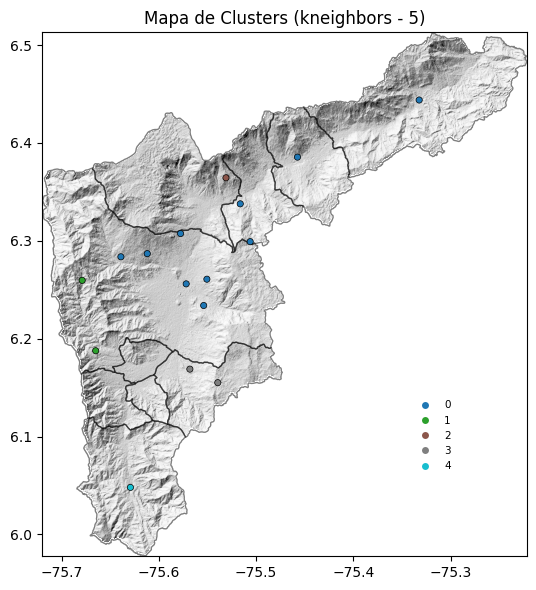

Generando mapa con 6 clusters


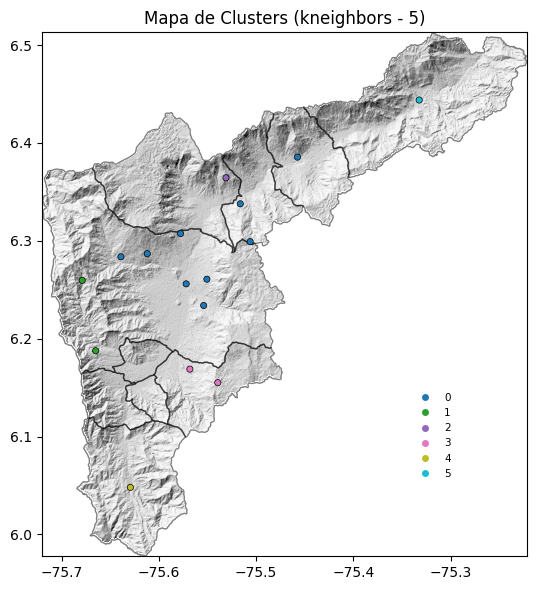

Haciendo mapas con método de conectividad: radius y parámetro 5000
Generando mapa con 4 clusters


/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:325: UserWarning: the number of connected components of the connectivity matrix is 9 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


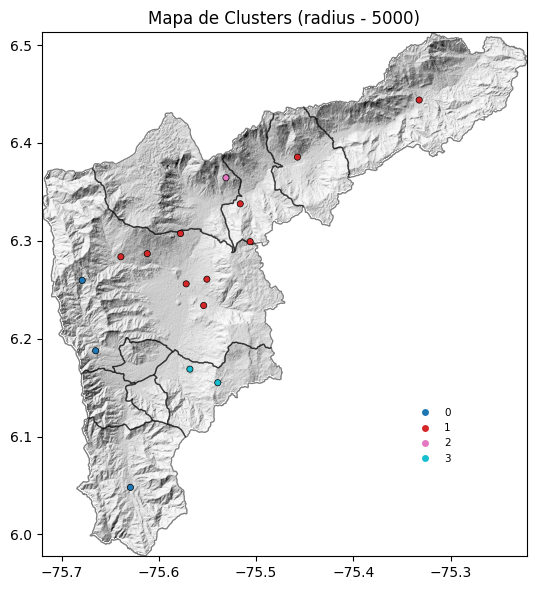

Generando mapa con 5 clusters


/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:325: UserWarning: the number of connected components of the connectivity matrix is 9 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


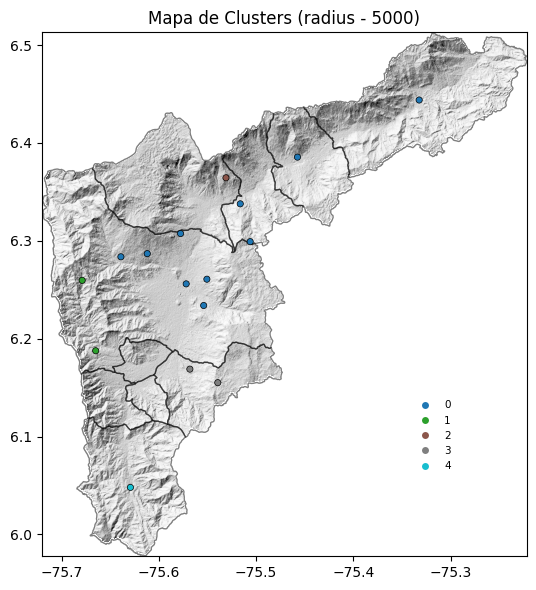

Generando mapa con 6 clusters


/home/oisanchezp/Geotecnia/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:325: UserWarning: the number of connected components of the connectivity matrix is 9 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


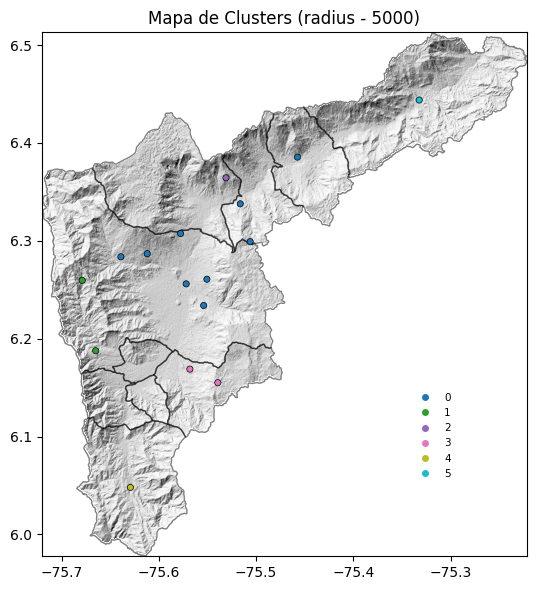

Haciendo mapas con método de conectividad: delaunay y parámetro None
Generando mapa con 4 clusters


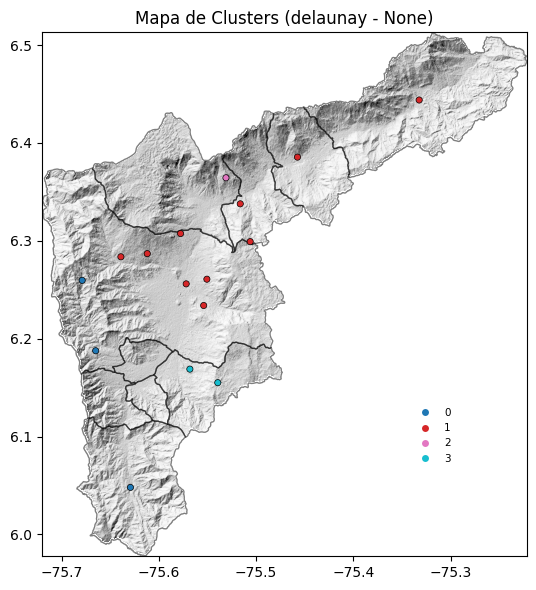

Generando mapa con 5 clusters


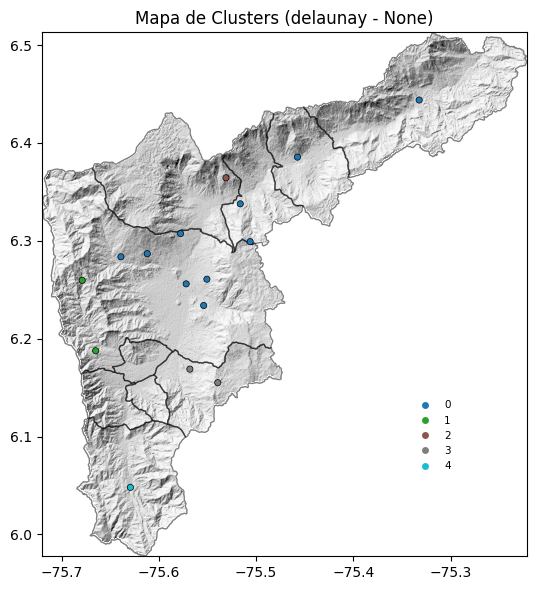

Generando mapa con 6 clusters


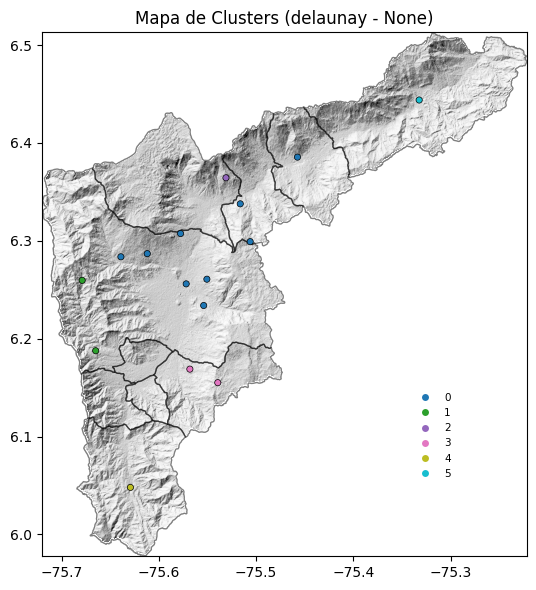

In [23]:
# 📌 Generar mapas para 4, 5 y 6 clusters con distintas matrices de conectividad
for method, param in [('kneighbors', 5), ('radius', 5000), ('delaunay', None)]:
    print(f'Haciendo mapas con método de conectividad: {method} y parámetro {param}')
    for n in [4, 5, 6]:
        print(f"Generando mapa con {n} clusters")
        plot_cluster_map(n_clusters=n, connectivity_method=method, param=param)